# Time series analysis from Kaggle Notebook
https://www.kaggle.com/code/kashnitsky/topic-9-part-1-time-series-analysis-in-python

In [2]:
import warnings                                  # `do not disturbe` mode
warnings.filterwarnings('ignore')

import numpy as np                               # vectors and matrices
import pandas as pd                              # tables and data manipulations
import matplotlib.pyplot as plt                  # plots
import seaborn as sns                            # more plots

from dateutil.relativedelta import relativedelta # working with dates with style
from scipy.optimize import minimize              # for function minimization

import statsmodels.formula.api as smf            # statistics and econometrics
import statsmodels.tsa.api as smt
import statsmodels.api as sm
import scipy.stats as scs

from itertools import product                    # some useful functions
from tqdm import tqdm


import hvplot.pandas
import hvplot as hv

from pypalettes import load_cmap, add_cmap


# Festlegen der Farben
cmap = load_cmap("Apricot")
cmap_continuous = add_cmap(
    colors=["#FFFFFFFF", "#FFF9A1FF", "#BAD09DFF", "#76D3CFFF", "#459E9EFF", "#306677FF", "#24385FFF", "#132157FF"],
    name="apricot_continuous",
    cmap_type="continuous"
)
cmap8 = add_cmap(
    colors=['#D72000FF', '#EE6100FF', '#FFAD0AFF', '#FFD700FF', '#1BB6AFFF', '#005F73FF', '#9093A2FF', '#132157FF'],
    name="apricot8colors",
    cmap_type="discrete"
)
cmap7 = add_cmap(
    colors=['#D72000FF', '#EE6100FF', '#FFAD0AFF', '#FFD700FF', '#1BB6AFFF', '#9093A2FF', '#132157FF'],
    name="apricot7colors",
    cmap_type="discrete"
)


%matplotlib inline



In [3]:
# Load Timestamp of Dataset
df_daily = pd.read_csv('df_daily.csv')
df_hourly = pd.read_csv('df_hourly_2020.csv')
df_daily_test = pd.read_csv('df_daily_2024.csv')
df_hourly_test = pd.read_csv('df_hourly_2024.csv')


## Time series analysis in Python
Analyse aus: https://www.kaggle.com/code/kashnitsky/topic-9-part-1-time-series-analysis-in-python/notebook 25.07.24, 10:56
Und aus Atwan.2022: *Time Series Analysis*. 10 Building Univariate Time Series Models Using Statistical Methods: https://learning.oreilly.com/library/view/time-series-analysis/9781805124283/text/ch011.xhtml#join-our-book-community-on-discord-9

In [4]:
df_hourly.hvplot(x='date', y='calls',title='Hourly Calls from 2020 to 2023', color=cmap.colors[1], width=1800, height=400)

:Curve   [date]   (calls)

In [5]:
df_daily.hvplot(x='date', y='calls',title='Daily Calls from 2020 to 2023', color=cmap.colors[3], width=1800, height=400)

:Curve   [date]   (calls)

### Forecast quality metrics

In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
from statsmodels.tsa.api import (kpss, adfuller,
                              seasonal_decompose, STL)
from statsmodels.tools.eval_measures import rmspe, rmse
from sklearn.metrics import mean_absolute_percentage_error as mape
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from itertools import product
from pathlib import Path
warnings.filterwarnings('ignore')
plt.rcParams["figure.figsize"] = [12, 5]
plt.style.use('grayscale')
warnings.filterwarnings('ignore')

## Split and Test Data
**df_hourly**  
Train Data: 2020 - 2023 (inclusive)  
Test Data: 1st Semester 2024
  
**df_daily**  
Train Data: 2014 - 2023 (inclusive)  
Test Data: 1st Semester 2024

In [7]:
def compare_statistics(train, test, freq='hourly'):
    """
    Vergleicht die wichtigsten statistischen Eigenschaften von Trainings- und Testdaten.
    
    Args:
    - train (pd.DataFrame): Trainingsdaten mit Spalte 'calls'.
    - test (pd.DataFrame): Testdaten mit Spalte 'calls'.
    - freq (str): Frequenzbeschreibung (z.B. 'hourly', 'daily').
    
    Returns:
    - pd.DataFrame: Zusammenfassung der Statistik und Verhältnisse.
    """
    # Berechnung der Basisstatistiken
    stats_train = train['calls'].describe()
    stats_test = test['calls'].describe()
    
    # Berechnung des Verhältnisses zwischen Test und Train
    ratio = stats_test / stats_train

    # Hinzufügen der Datenmenge
    count_train = train.shape[0]
    count_test = test.shape[0]
    count_ratio = count_test / count_train

    # Zusammenfügen in ein DataFrame
    stats_summary = pd.DataFrame({
        'Train': stats_train,
        'Test': stats_test,
        'Ratio (Test/Train)': ratio
    })

    # Hinzufügen der Datenmengen und ihres Verhältnisses
    stats_summary.loc['Count'] = [count_train, count_test, count_ratio]

    print(f"Statistikvergleich für {freq} Daten:")
    return stats_summary


# Vergleich für df_hourly und df_hourly_test
hourly_stats = compare_statistics(df_hourly, df_hourly_test, freq='hourly')
print(hourly_stats)

# Vergleich für df_daily und df_daily_test
daily_stats = compare_statistics(df_daily, df_daily_test, freq='daily')
print(daily_stats)


Statistikvergleich für hourly Daten:
              Train         Test  Ratio (Test/Train)
count  30696.000000  4368.000000            0.142299
mean      11.221886    16.350046            1.456978
std        8.055933    11.156030            1.384822
min        0.000000     0.000000                 NaN
25%        4.000000     6.000000            1.500000
50%       11.000000    16.000000            1.454545
75%       16.000000    24.000000            1.500000
max       59.000000    64.000000            1.084746
Count  30696.000000  4368.000000            0.142299
Statistikvergleich für daily Daten:
             Train         Test  Ratio (Test/Train)
count  3607.000000  1461.000000            0.405046
mean    296.481009  1190.668036            4.016001
std     101.740170   506.436122            4.977740
min       2.000000    11.000000            5.500000
25%     229.500000   955.000000            4.161220
50%     288.000000  1244.000000            4.319444
75%     367.000000  1517.000000  

### Hilfsfunkktionen: check_stationarity, get_top_models_df, plot_forecast, combinator

In [78]:
def check_stationarity(df):
    results = adfuller(df)[1:3]
    s = 'Non-Stationary'
    if results[0] < 0.05:
        s = 'Stationary'
    print(f"'{s}\t p-value:{results[0]} \t lags:{results[1]}")
    return (s, results[0])

def get_top_models_df(scores, criterion='AIC', top_n=5):
    sorted_scores = sorted(scores.items(),
                           key=lambda item: item[1][criterion])
   
    top_models = sorted_scores[:top_n]
    data = [v for k, v in top_models]
    df = pd.DataFrame(data)
   
    df['model_id'] = [k for k, v in top_models]
    df.set_index('model_id', inplace=True)
    return df

def plot_forecast(model, start, train, test):
    forecast = pd.DataFrame(model.forecast(test.shape[0]),
                            index=test.index)
    ax = train.loc[start:].plot(style='--')
    test.plot(ax=ax)
    forecast.plot(ax=ax, style = '-.')
    ax.legend(['orig_train', 'orig_test', 'forecast'])
    plt.show()

def mean_absolute_error(actual, predicted):
    """
    Berechnet den mittleren absoluten Fehler (MAE) zwischen zwei Zeitreihen.
    
    Parameters:
        actual (pd.Series or np.ndarray): Die tatsächlichen Werte.
        predicted (pd.Series or np.ndarray): Die vorhergesagten Werte (z. B. gleitender Mittelwert).
        
    Returns:
        float: Der mittlere absolute Fehler.
    """
    actual = np.array(actual)
    predicted = np.array(predicted)
    return np.mean(np.abs(actual - predicted))

def mean_squared_error(actual, predicted):
    """
    Berechnet den mittleren quadratischen Fehler (MSE) zwischen zwei Zeitreihen.
    
    Parameters:
        actual (pd.Series or np.ndarray): Die tatsächlichen Werte.
        predicted (pd.Series or np.ndarray): Die vorhergesagten Werte.
        
    Returns:
        float: Der mittlere quadratische Fehler.
    """
    actual = np.array(actual)
    predicted = np.array(predicted)
    return np.mean((actual - predicted) ** 2)

def mean_squared_log_error(actual, predicted):
    """
    Berechnet den mittleren logarithmischen quadratischen Fehler (MSLE).
    
    Parameters:
        actual (pd.Series or np.ndarray): Die tatsächlichen Werte.
        predicted (pd.Series or np.ndarray): Die vorhergesagten Werte.
        
    Returns:
        float: Der MSLE.
    """
    actual = np.array(actual)
    predicted = np.array(predicted)
    return np.mean((np.log1p(actual) - np.log1p(predicted)) ** 2)

def mean_absolute_percentage_error(y_true, y_pred): 
    """
    Calculate the mean absolute percentage error (MAPE)
    
    Parameters:
        y_true (array-like): Actual values
        y_pred (array-like): Predicted values
    
    Returns:
        float: MAPE value in percentage
    """
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    nonzero_indices = y_true != 0  # Avoid division by zero
    return np.mean(np.abs((y_true[nonzero_indices] - y_pred[nonzero_indices]) / y_true[nonzero_indices])) * 100

def combinator(items):
    combo = [i for i in product(*items)]
    return combo

## Moving, Smoothing and Evaluation
### Berechnung des Gleitenden Mittelwertes


In [62]:
# Berechnung des Gleitenden Mittelwertes
def moving_average(series, n):
    """
        Calculate average of last n observations
    """
    return np.average(series[-n:])

moving_average(df_daily['calls'], 7) # Berechnung des Mittelswertes der letzten sieben Tage

np.float64(354.0)

In [64]:
def plotMovingAverage(series, window, plot_intervals=False, scale=1.96, plot_anomalies=False):
    """
        series - dataframe with timeseries
        window - rolling window size 
        plot_intervals - show confidence intervals
        plot_anomalies - show anomalies 
    """
    rolling_mean = series.rolling(window=window).mean()

    plt.figure(figsize=(15, 5))
    plt.title("Moving average\n window size = {}".format(window))
    
    # Plot actual values first to keep them in the background
    plt.plot(series, label="Actual values", color=cmap.colors[3])

    # Plot rolling mean trend
    plt.plot(rolling_mean, "g", label="Rolling mean trend", color=cmap.colors[1])

    # Plot confidence intervals for smoothed values
    if plot_intervals:
        mae = mean_absolute_error(series[window:], rolling_mean[window:])
        deviation = np.std(series[window:] - rolling_mean[window:])
        lower_bond = rolling_mean - (mae + scale * deviation)
        upper_bond = rolling_mean + (mae + scale * deviation)
        plt.plot(upper_bond, "r--", label="Upper Bond / Lower Bond")
        plt.plot(lower_bond, "r--")
        
        # Having the intervals, find abnormal values
        if plot_anomalies:
            anomalies = pd.DataFrame(index=series.index)
            anomalies[series < lower_bond] = series[series < lower_bond]
            anomalies[series > upper_bond] = series[series > upper_bond]
            plt.plot(anomalies, "ro", markersize=10)
        
    plt.legend(loc="upper left")
    plt.grid(True)
    plt.show()


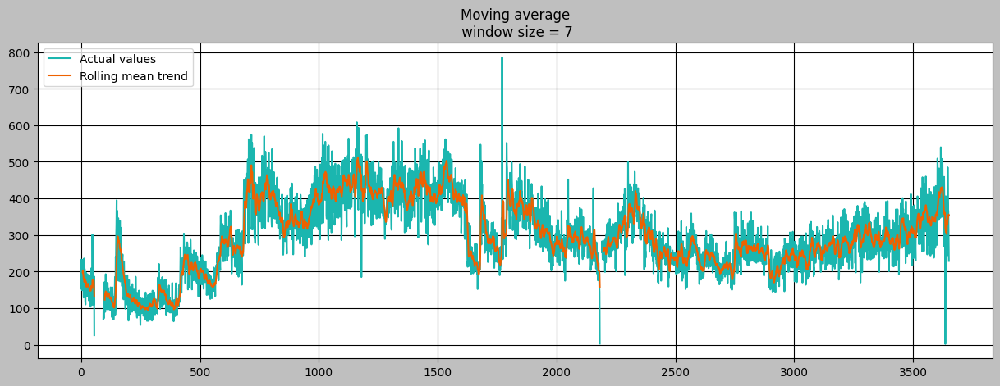

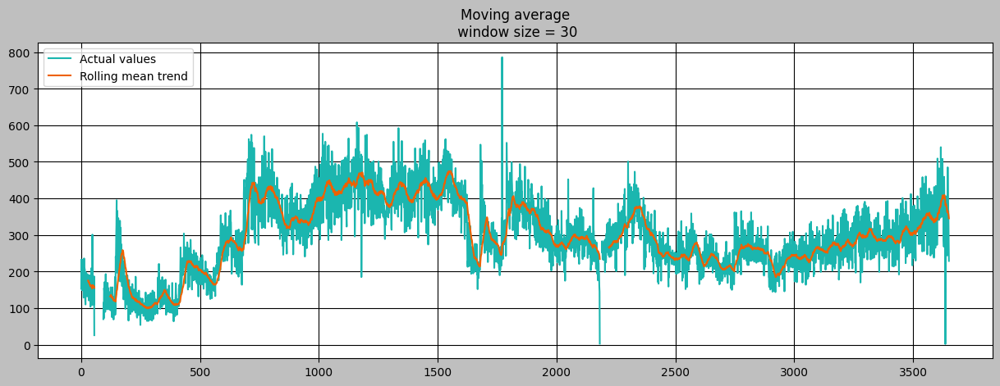

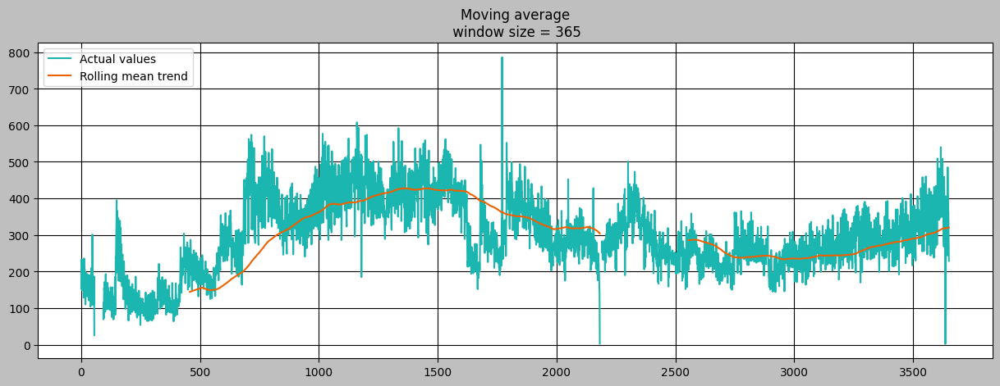

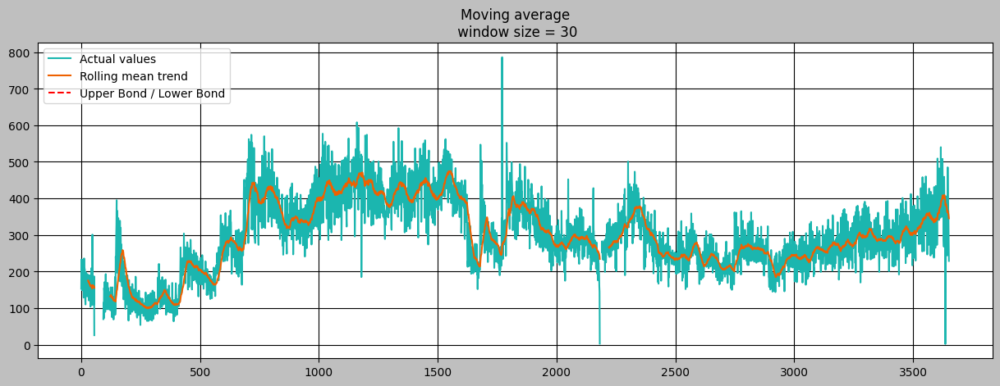

In [65]:
plotMovingAverage (df_daily['calls'], 7)



plotMovingAverage (df_daily['calls'], 30)



plotMovingAverage (df_daily['calls'], 365) 



plotMovingAverage(df_daily['calls'], 30, plot_intervals=True, plot_anomalies= True)


### Gewichteter Durchschnitt

In [10]:
def weighted_average(series, weights):
    """
        Calculate weighted average on the series.
        Assuming weights are sorted in descending order
        (larger weights are assigned to more recent observations).
    """
    result = 0.0
    for n in range(len(weights)):
        result += series.iloc[-n-1] * weights[n]
    return float(result)

In [11]:
weighted_average(df_daily['calls'], [0.6, 0.3, 0.1])

263.40000000000003

### Exponentielle Glättung

In [12]:
def exponential_smoothing(series, alpha):
    """
        series - dataset with timestamps
        alpha - float [0.0, 1.0], smoothing parameter
    """
    result = [series[0]] # first value is same as series
    for n in range(1, len(series)):
        result.append(alpha * series[n] + (1 - alpha) * result[n-1])
    return result

## Vorbereitungen des Daten df_hourly für SARIMAX
### ACF und PACF für df_hourly

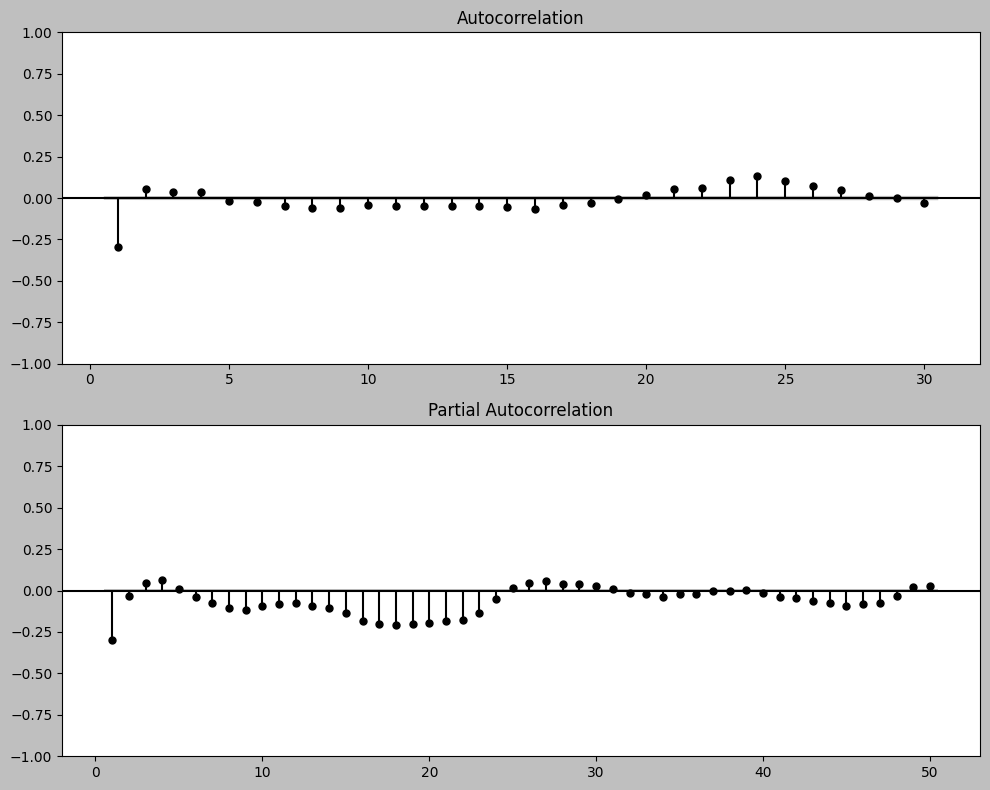

In [13]:
# ACF und PACF
# Nur die Spalte 'calls' auswählen und Differenz berechnen
hourly_diff = df_hourly['calls'].diff().dropna()

# ACF und PACF Plots
fig, ax = plt.subplots(2, 1, figsize=(10, 8))
plot_acf(hourly_diff, zero=False, lags=30, ax=ax[0])
plot_pacf(hourly_diff, zero=False, lags=50, ax=ax[1])
plt.tight_layout()
plt.show()


Analyse der Plots (von ChatGPT):
1. Autokorrelation (ACF-Plot):

    Es gibt signifikante Autokorrelationen (Punkte außerhalb des grauen Bereichs) in den ersten wenigen Lags.
    Ab Lag 1 sinken die Korrelationen und nähern sich langsam Null an. Das deutet darauf hin, dass kurzfristige Abhängigkeiten bestehen, aber keine langfristigen Trends vorliegen.
    Bei Lags, die Vielfache von 24 sind (z. B. Lag 24), könnten saisonale Muster sichtbar werden (d. h., tägliche Wiederholungen).

2. Partielle Autokorrelation (PACF-Plot):

    Die PACF zeigt in den ersten Lags einige signifikante Werte, danach nähern sich die Werte ebenfalls Null.
    Dies deutet darauf hin, dass ein AR-Term (autoregressiver Term) mit niedrigem Grad sinnvoll sein könnte.

3. Fehlen eines grauen Bereichs:

    Der graue Bereich repräsentiert das 95%-Konfidenzintervall, innerhalb dessen die Werte zufällige Schwankungen darstellen könnten.
    Dass fast kein grauer Bereich sichtbar ist, bedeutet:
        Große Datenmenge: Mit sehr vielen Datenpunkten wird der Standardfehler kleiner, was zu schmaleren Konfidenzintervallen führt.
        Die meisten Punkte, die außerhalb des Bereichs liegen, sind tatsächlich signifikant.  
  
**Fehlen des grauen Bereichs**  
Was es bedeutet:

Sehr starke Autokorrelation:
    Deine Daten zeigen ein starkes Abhängigkeitsmuster, das entweder von einer saisonalen Komponente, einem Trend oder anderen systematischen Faktoren herrührt.
    Das ist nicht unbedingt "schlecht", zeigt aber, dass die Daten vor der Modellierung möglicherweise weitere Transformationen oder Differenzierungen benötigen.

Extrem schmale Konfidenzintervalle:
    Wenn die Datenmenge sehr groß ist, werden die Konfidenzintervalle schmaler. Das führt dazu, dass selbst kleine Abweichungen signifikant werden. Dies könnte technisch "überbewertet" sein und dir suggerieren, dass es mehr Signifikanz gibt als tatsächlich notwendig.

Fehler in der Datenvorbereitung:
    Falls die Daten nicht korrekt skaliert, transformiert oder differenziert wurden, könnten die Plots nicht die tatsächliche Struktur der Daten widerspiegeln.

In [14]:
# Make Time Series Stationary

from statsmodels.tsa.stattools import adfuller


# Anwendung auf df_hourly
hourly_diff_24 = df_hourly['calls'].diff(24).dropna()
check_stationarity(hourly_diff_24)

'Stationary	 p-value:0.0 	 lags:51


('Stationary', 0.0)

Interpretation von ChatGPT:  
  
1. Stationarity

    Stationary: Die Zeitreihe wird durch den Augmented Dickey-Fuller-Test (ADF) als stationär erkannt. Das bedeutet:
        Es gibt keine systematischen Trends (z. B. Aufwärtstrend oder Abwärtstrend).
        Die Varianz bleibt konstant.
        Es gibt keine stark ausgeprägten saisonalen Muster mehr.

2. p-value

    p-value: 0.0:
        Der p-Wert ist extrem klein (im Wesentlichen Null), was die Nullhypothese des ADF-Tests (dass die Zeitreihe nicht stationär ist) mit sehr hoher Sicherheit ablehnt.
        Dies ist ein sehr starkes Indiz dafür, dass die Zeitreihe jetzt stationär ist.

3. Lags

    lags: 51:
        Das bedeutet, dass im ADF-Test bis zu 51 vergangene Zeitpunkte (Lags) berücksichtigt wurden, um die Autokorrelation der Zeitreihe zu testen.
        Dies ist normal für Zeitreihen mit saisonalen Mustern, da die Autokorrelation vor der Differenzierung sehr stark war (z. B. Wiederholungen in 24-Stunden-Zyklen).

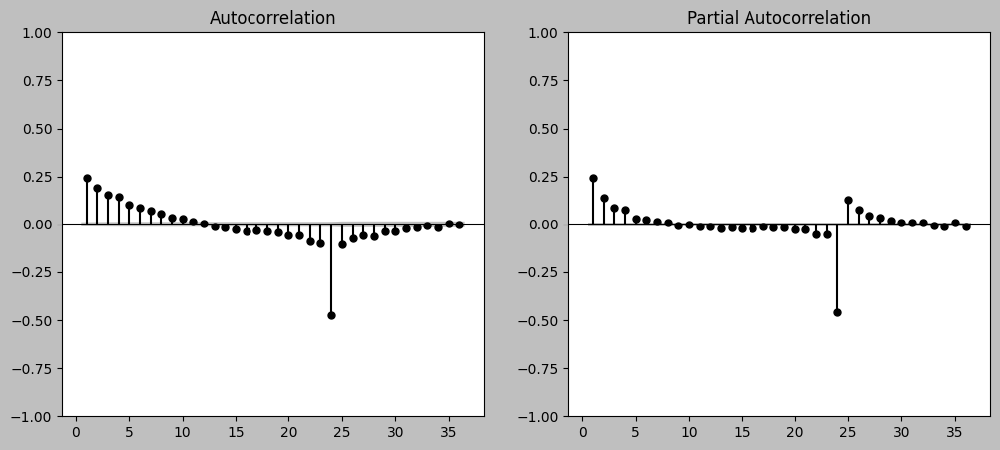

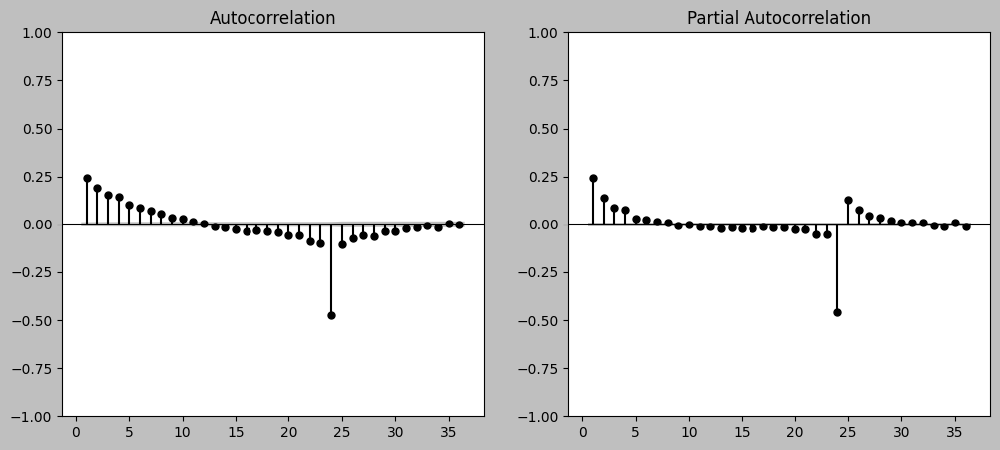

In [15]:
fig, ax = plt.subplots(1,2)
plot_acf(hourly_diff_24, zero=False, ax=ax[0], lags=36)
plot_pacf(hourly_diff_24, zero=False, ax=ax[1], lags=36)

Analyse der Plots (neu interpretiert):
1. ACF (Autokorrelation):

    Fast linear absteigend von Lag 0 bis Lag 23:
    Dieses Verhalten ist typisch für einen nicht-stationären Prozess, was eine Differenzierung (d=1d=1) erforderlich macht.

    Starker negativer Peak bei Lag 24 (-0,5):
    Dies deutet auf eine saisonale Komponente mit Periodizität von 24 hin. Da es ein negativer Peak ist, spricht dies für eine saisonale Moving-Average-Komponente (SMA(Q)SMA(Q)).

    Nach Lag 24: Stückweise Annäherung an 0:
    Das bedeutet, dass nach der Berücksichtigung der Saisonalität keine starke weitere Struktur übrig bleibt.

2. PACF (Partielle Autokorrelation):

    Fast linear absteigend von Lag 0 bis Lag 23:
    Auch hier zeigt sich eine Notwendigkeit zur Differenzierung (d=1d=1).

    Starker negativer Peak bei Lag 24 (-0,5):
    Dies unterstützt die Annahme einer saisonalen Autokorrelationsstruktur (SAR(P)SAR(P)) oder einer saisonalen Moving-Average-Komponente (SMA(Q)SMA(Q)).

    Nach Lag 24: Stückweise Annäherung an 0:
    Auch hier keine weiteren signifikanteren Strukturen.

Modellvorschlag:

Das Muster weist auf eine klare Saisonalität mit einer Periode von 24 (z. B. stündliche Daten mit einem täglichen Muster) hin. Daraus ergibt sich ein SARIMA-Modell:
SARIMA(p,d,q)×(P,D,Q,s)
SARIMA(p,d,q)×(P,D,Q,s)

    Nicht-saisonale Komponenten:
        p=1p=1: Ein autoregressiver Term, da der PACF an Lag 1 positiv startet.
        d=1d=1: Differenzierung wegen der nicht-stationären Struktur.
        q=0q=0: Kein Hinweis auf eine nicht-saisonale Moving-Average-Komponente.

    Saisonale Komponenten:
        P=0P=0: Kein saisonaler autoregressiver Term (keine saisonalen Peaks im PACF).
        D=1D=1: Eine saisonale Differenzierung wegen des saisonalen Peaks.
        Q=1Q=1: Eine Moving-Average-Komponente wegen des negativen Peaks bei Lag 24.
        s=24s=24: Saisonalität mit Periodizität 24.

**Modell: SARIMA(1, 1, 0) × (0, 1, 1, 24)**


ACF und PACF Zusammenfassung der Unterschiede (von ChatGPT)  
| Eigenschaft	| ACF (ax[0]) |	PACF (ax[1]) |
| -------- | -------- | -------- |
| Art der Korrelation	| Gesamtkorrelation |	Direkte Korrelation |
| Ziel | Bestimmt den MA-Teil (q) | Bestimmt den AR-Teil (p) |
| Was sie zeigt | Einfluss aller vorherigen Lags | Einfluss eines spezifischen Lags |
| Abfall im Plot | Plötzlicher Abfall → Hinweis auf q	| Plötzlicher Abfall → Hinweis auf p |

Interpretation des ACF-Plots (links):

Langsamer Abfall:
    Die ACF nimmt mit zunehmender Verzögerung allmählich ab, was auf eine saisonale oder lang anhaltende Abhängigkeit hinweisen könnte.
    Solche Muster deuten oft darauf hin, dass ein Moving-Average-Teil (q) erforderlich ist.
Signifikanter Peak bei Lag 24:
    Ein starker negativer Peak bei Lag 24 deutet auf eine saisonale Komponente hin. Dies ist typisch für Daten mit täglicher Periodizität (z. B. 24 Stunden).

Interpretation des PACF-Plots (rechts):

Signifikante Peaks bei niedrigen Lags:
    Der erste Lag (1) und ein weiterer Peak bei Lag 24 sind signifikant. Das könnte darauf hinweisen, dass die Zeitreihe eine autoregressive Struktur (p) hat.
Schneller Abfall:
    Die PACF fällt nach Lag 1 stark ab, was darauf hindeutet, dass möglicherweise ein AR(1)-Modell passend ist.

Zusammenfassung für SARIMA-Parameterwahl:

Nicht-saisonale Komponenten:
    ACF zeigt auf q=1 (da der erste Punkt in der ACF stark signifikant ist).
    PACF zeigt auf p=1 (da der erste Punkt in der PACF signifikant ist).
Saisonale Komponenten:
    Ein signifikanter Peak bei Lag 24 in beiden Plots deutet auf saisonale Komponenten hin:
        P=1 (saisonaler AR-Teil).
        Q=1 (saisonaler MA-Teil).
        Saisonale Periode = 24 (z. B. stündliche Daten mit täglicher Periodizität).

### SARIMAX

Was macht der Code?

    SARIMAX-Modell erstellen:
        order=(0,1,1): Einfache MA(1)-Komponente mit einer Differenzierung zur Stationarität.
        seasonal_order=(0,1,1,24): Saisonale MA(1)-Komponente mit Differenzierung über 24 Stunden (tägliche Saisonalität).
    Anpassung des Modells:
        Die Methode .fit() passt das SARIMAX-Modell an die stündlichen Anrufdaten an.
    Residuenanalyse:
        Der Autokorrelationsplot (ACF) der Residuen wird erstellt, um zu prüfen, ob noch Autokorrelationen vorhanden sind. Wenn keine signifikanten Autokorrelationen vorliegen, ist das Modell gut angepasst



### Berechnung des Modells für df_hourly mit SARIMA

In [18]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.graphics.tsaplots import plot_acf
import matplotlib.pyplot as plt

                                        SARIMAX Results                                        
Dep. Variable:                                   calls   No. Observations:                30672
Model:             SARIMAX(1, 0, 1)x(1, 1, [1, 2], 24)   Log Likelihood              -88232.501
Date:                                 Tue, 07 Jan 2025   AIC                         176477.001
Time:                                         15:01:20   BIC                         176526.983
Sample:                                              0   HQIC                        176493.022
                                               - 30672                                         
Covariance Type:                                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8355      0.006    130.405      0.000       0.823       0

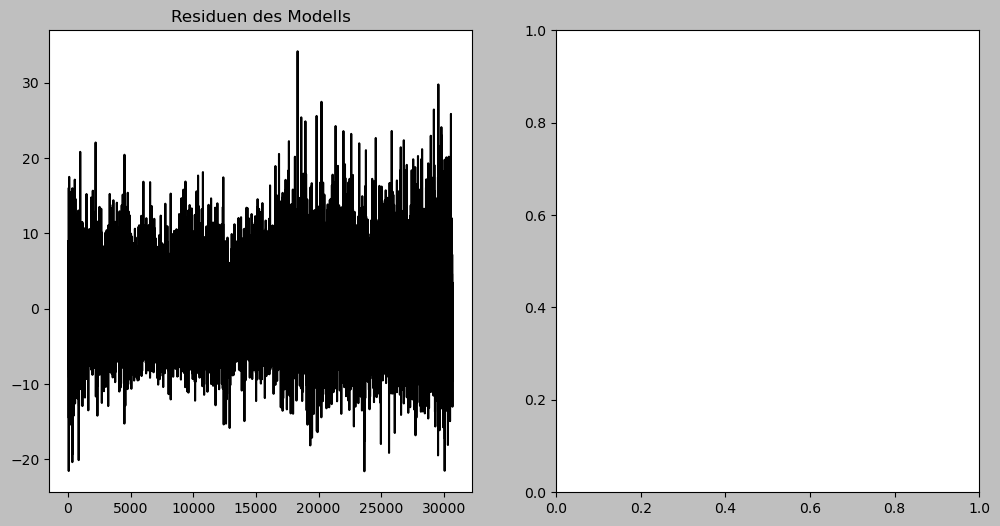

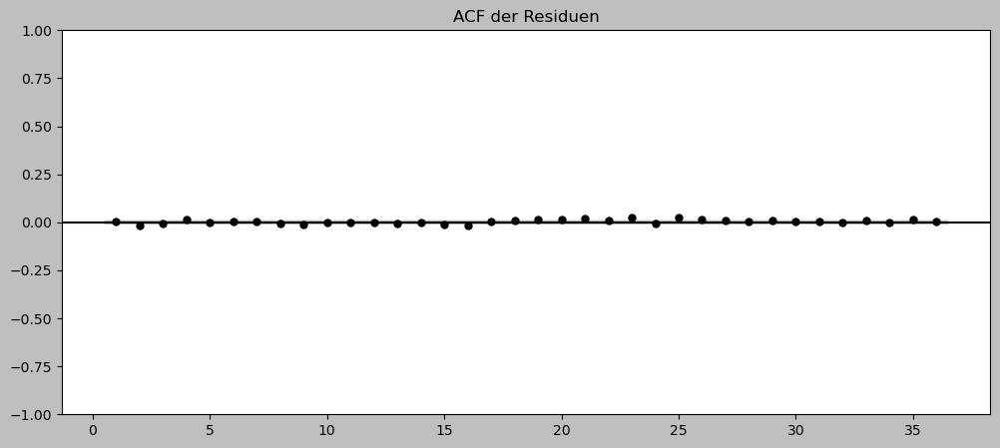

In [12]:
model = SARIMAX(hourly_diff_24, 
                order=(1,0,1), 
                seasonal_order=(1,1,2,24)).fit(disp=False)
print(model.summary())
## Das ist bisher das beste Modell 

# Plot der Residuen
# Die Residuen sollten keine offensichtliche Struktur mehr haben (zufällig um 0 verteilt).
# Die ACF der Residuen sollte für alle Lags innerhalb des Konfidenzintervalls (grauer Bereich) liegen.
residuals = model.resid
plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.plot(residuals)
plt.title("Residuen des Modells")
plt.subplot(122)
plot_acf(residuals, zero=False, lags=36)
plt.title("ACF der Residuen")
plt.show()

AIC (Akaike Information Criterion): Je niedriger der Wert, desto besser das Modell.  
BIC (Bayesian Information Criterion): Wie AIC, aber mit stärkerer Berücksichtigung der Modellkomplexität.  
Koeffizienten und p-Werte: Zeigen, ob die geschätzten Parameter statistisch signifikant sind.

                                      SARIMAX Results                                       
Dep. Variable:                                calls   No. Observations:                30672
Model:             SARIMAX(1, 1, 2)x(1, 0, [1], 24)   Log Likelihood              -88077.262
Date:                              Wed, 15 Jan 2025   AIC                         176166.523
Time:                                      08:54:51   BIC                         176216.510
Sample:                                           0   HQIC                        176182.545
                                            - 30672                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8047      0.008    104.442      0.000       0.790       0.820
ma.L1         -1.59

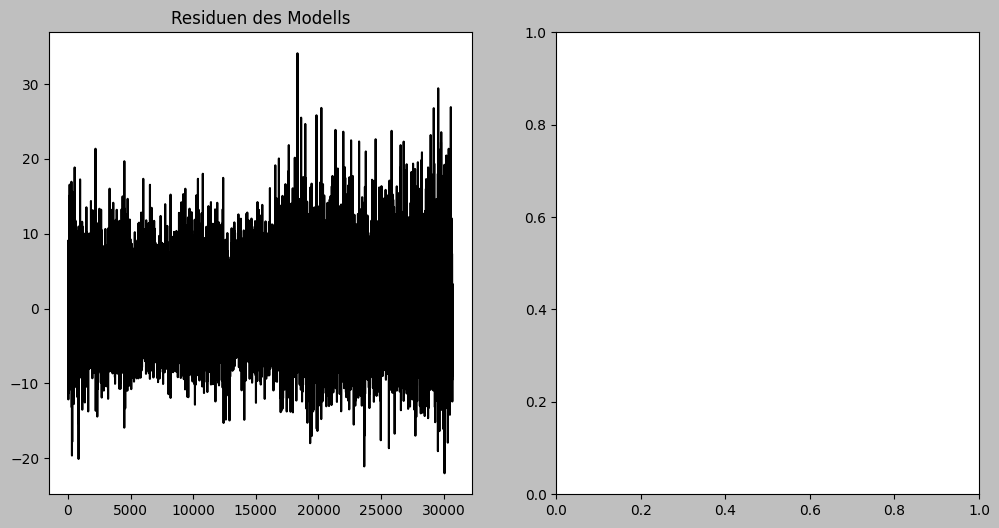

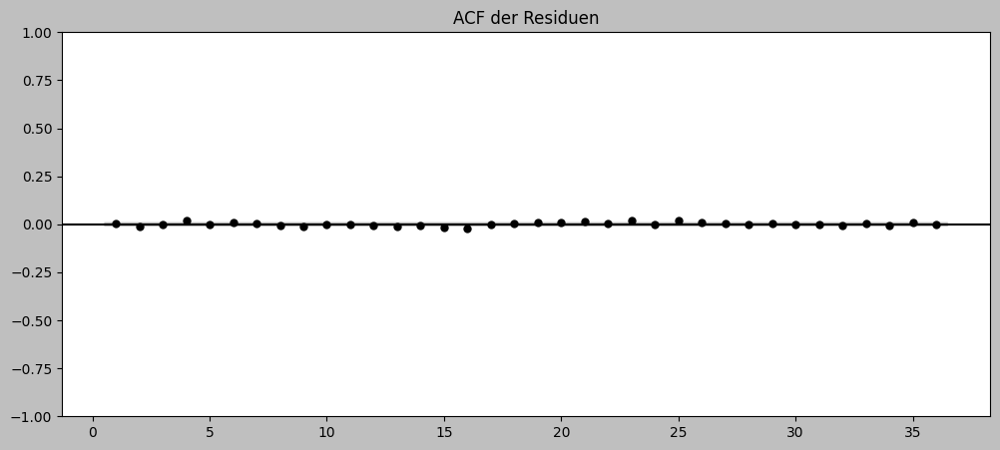

In [19]:
# Werte aus HPO mit Optuna
model = SARIMAX(hourly_diff_24, 
                order=(1,1,2), 
                seasonal_order=(1,0,1,24)).fit(disp=False)
print(model.summary())
## Das ist bisher das beste Modell 

# Plot der Residuen
# Die Residuen sollten keine offensichtliche Struktur mehr haben (zufällig um 0 verteilt).
# Die ACF der Residuen sollte für alle Lags innerhalb des Konfidenzintervalls (grauer Bereich) liegen.
residuals = model.resid
plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.plot(residuals)
plt.title("Residuen des Modells")
plt.subplot(122)
plot_acf(residuals, zero=False, lags=36)
plt.title("ACF der Residuen")
plt.show()


## Vorbereitung von df_daily für SARIMAX

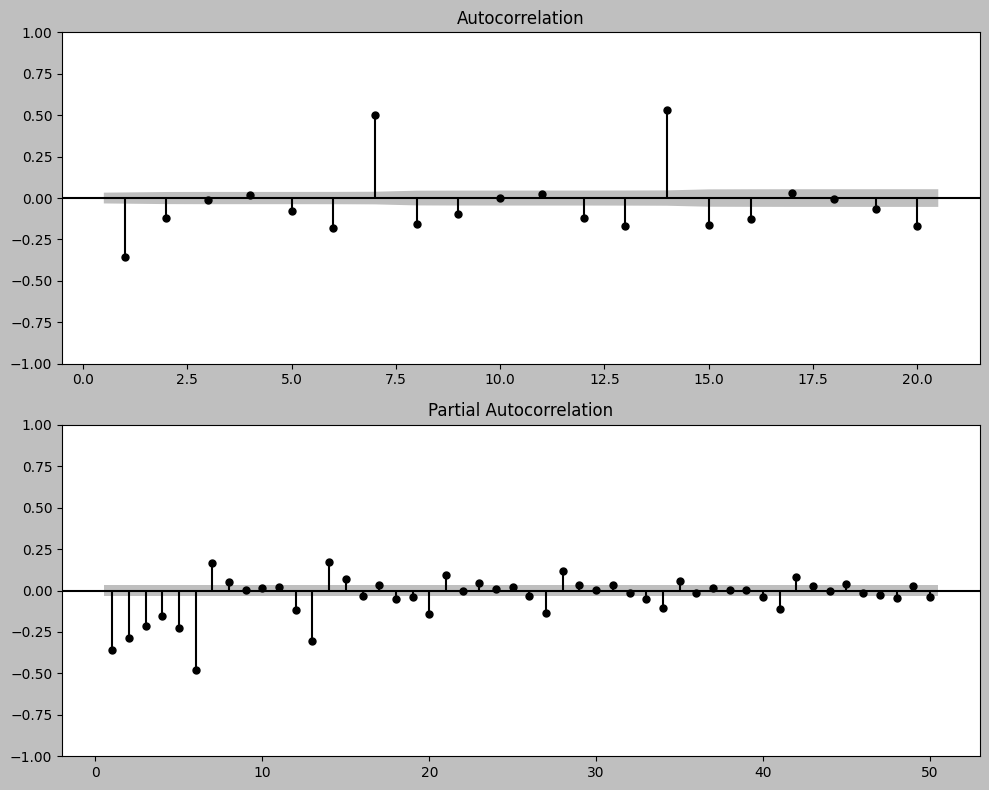

In [20]:
# ACF und PACF
# Nur die Spalte 'calls' auswählen und Differenz berechnen
daily_diff = df_daily['calls'].diff().dropna()

# ACF und PACF Plots
fig, ax = plt.subplots(2, 1, figsize=(10, 8))
plot_acf(daily_diff, zero=False, lags=20, ax=ax[0])
plot_pacf(daily_diff, zero=False, lags=50, ax=ax[1])
plt.tight_layout()
plt.show()

In [21]:
# Datensatz stationär werden lassen 
# Anwendung auf df_daily
daily_diff_7 = df_daily['calls'].diff(7).dropna()
check_stationarity(daily_diff_7)

'Stationary	 p-value:2.4490544761314682e-23 	 lags:28


('Stationary', np.float64(2.4490544761314682e-23))

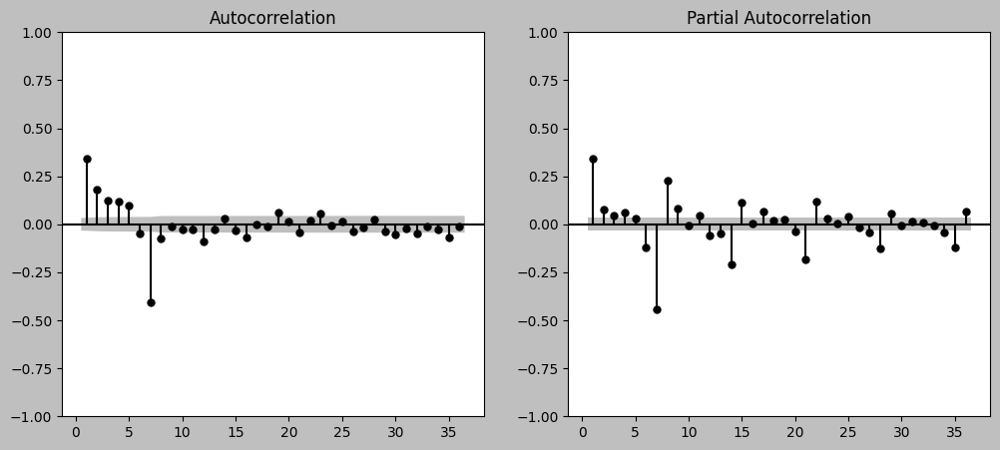

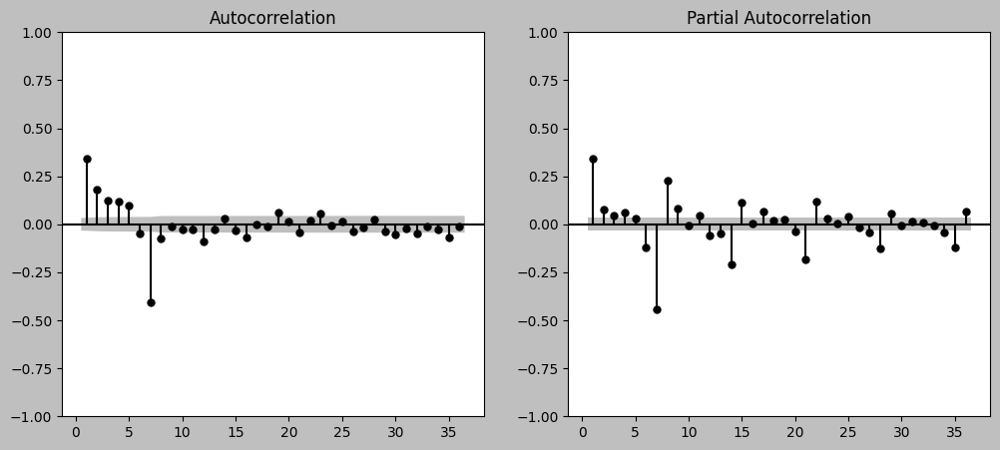

In [22]:
fig, ax = plt.subplots(1,2)
plot_acf(daily_diff_7, zero=False, ax=ax[0], lags=36)
plot_pacf(daily_diff_7, zero=False, ax=ax[1], lags=36)

In [23]:
from statsmodels.stats.diagnostic import acorr_ljungbox

ljung_box_result = acorr_ljungbox(daily_diff_7, lags=[10, 20, 30], return_df=True)
print(ljung_box_result)

        lb_stat      lb_pvalue
10  1298.013737  1.026514e-272
20  1370.588213  2.235701e-278
30  1415.835599  3.335950e-279


Das Ergebnis des Ljung-Box-Tests zeigt, dass die p-Werte für alle getesteten Lags (10, 20, 30) extrem klein sind (z.B. 1.026×10−2721.026×10−272). Das bedeutet, dass die Nullhypothese, dass die Residuen unkorreliert sind (weißes Rauschen), abgelehnt werden muss. Es gibt also weiterhin signifikante Autokorrelationen in den Residuen. (ChatGPT)

In [24]:
daily_diff_7_1 = daily_diff_7.diff(1).dropna()
check_stationarity(daily_diff_7_1)

'Stationary	 p-value:2.0242717172131786e-30 	 lags:30


('Stationary', np.float64(2.0242717172131786e-30))

Das Ergebnis zeigt, dass der Datensatz nach der zusätzlichen Differenzierung (zum Beispiel mit daily_diff_7.diff(1)) weiterhin stationär ist. Der p-Wert (2.02×10−302.02×10−30) ist extrem klein, was darauf hindeutet, dass die Nullhypothese des Augmented Dickey-Fuller-Tests abgelehnt wird. Dies bestätigt, dass keine Trends oder saisonalen Muster mehr im differenzierten Datensatz vorhanden sind.

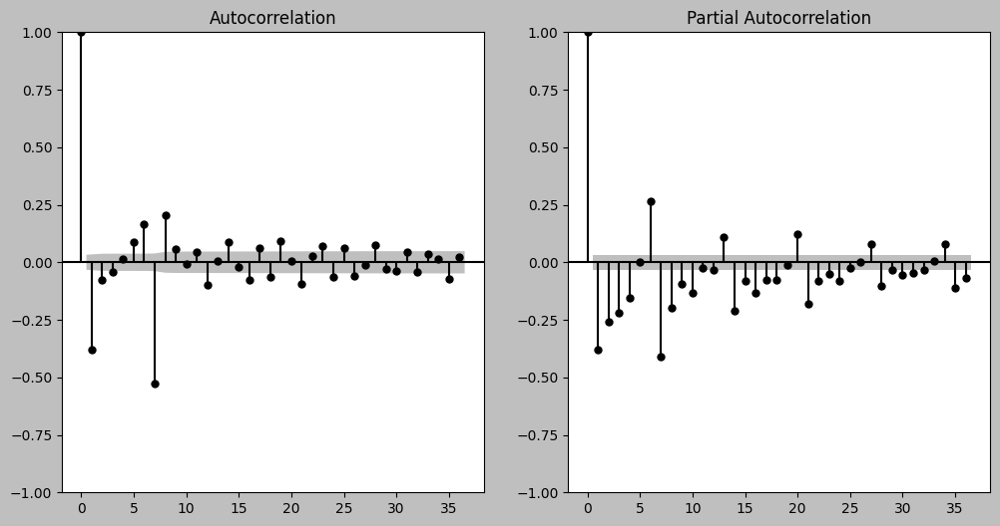

In [25]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(12, 6))
plot_acf(daily_diff_7_1, lags=36, ax=ax[0])
plot_pacf(daily_diff_7_1, lags=36, ax=ax[1])
plt.show()

                                     SARIMAX Results                                     
Dep. Variable:                             calls   No. Observations:                 3585
Model:             SARIMAX(1, 1, 2)x(2, 0, 2, 7)   Log Likelihood              -18065.402
Date:                           Wed, 15 Jan 2025   AIC                          36146.804
Time:                                   08:58:53   BIC                          36196.278
Sample:                                        0   HQIC                         36164.440
                                          - 3585                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1878      0.018     10.198      0.000       0.152       0.224
ma.L1         -1.7981      0.012   -151.496

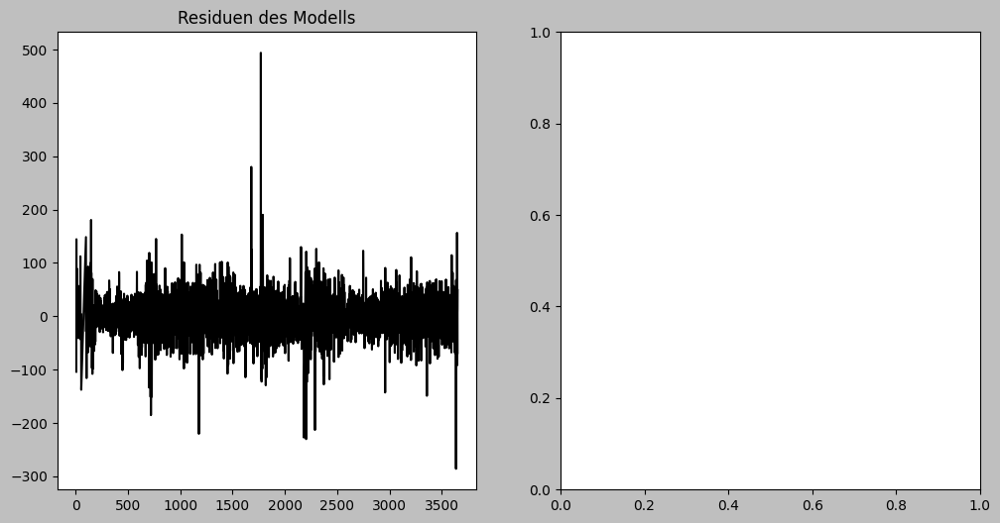

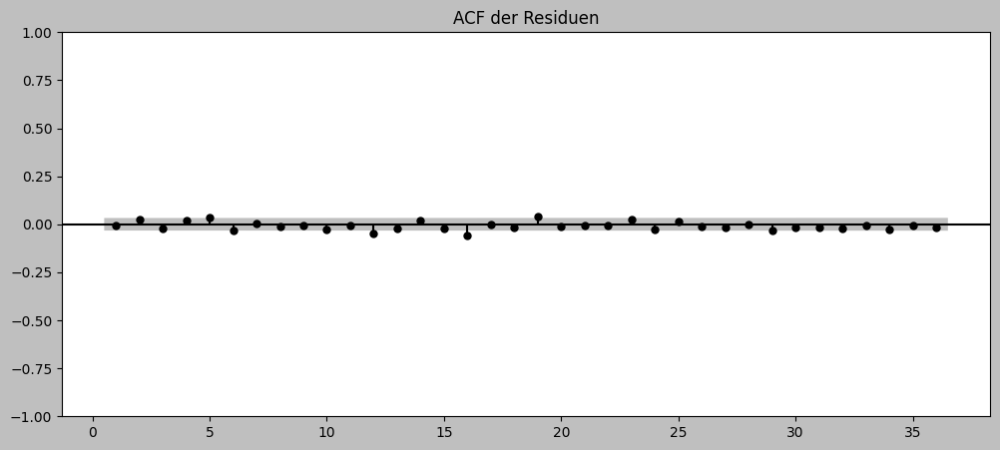

In [26]:

# SARIMA Modell mit HPO für df_daily
model = SARIMAX(daily_diff_7_1, 
                order=(1, 1, 2), 
                seasonal_order=(2, 0, 2, 7)).fit(disp=False)

print(model.summary())

# Plot der Residuen
# Die Residuen sollten keine offensichtliche Struktur mehr haben (zufällig um 0 verteilt).
# Die ACF der Residuen sollte für alle Lags innerhalb des Konfidenzintervalls (grauer Bereich) liegen.
residuals = model.resid
plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.plot(residuals)
plt.title("Residuen des Modells")
plt.subplot(122)
plot_acf(residuals, zero=False, lags=36)
plt.title("ACF der Residuen")
plt.show()

Das Modell ist nicht schlecht, liefert aber auch keine super Ergbenisse. Außerdem ist bei dem zugehörigen ACF Plot weiterhin ein zyklischer Ausreißer zu sehen, bei Lag = 7 und 14. Wir testen nun das Modell mit daily_diff_7, also mit einer Differenzierung weniger.

                                     SARIMAX Results                                     
Dep. Variable:                             calls   No. Observations:                 3586
Model:             SARIMAX(1, 0, 1)x(1, 1, 1, 7)   Log Likelihood              -18401.972
Date:                           Mon, 06 Jan 2025   AIC                          36813.944
Time:                                   11:11:02   BIC                          36844.858
Sample:                                        0   HQIC                         36824.964
                                          - 3586                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.7780      0.017     44.763      0.000       0.744       0.812
ma.L1         -0.4439      0.023    -18.915

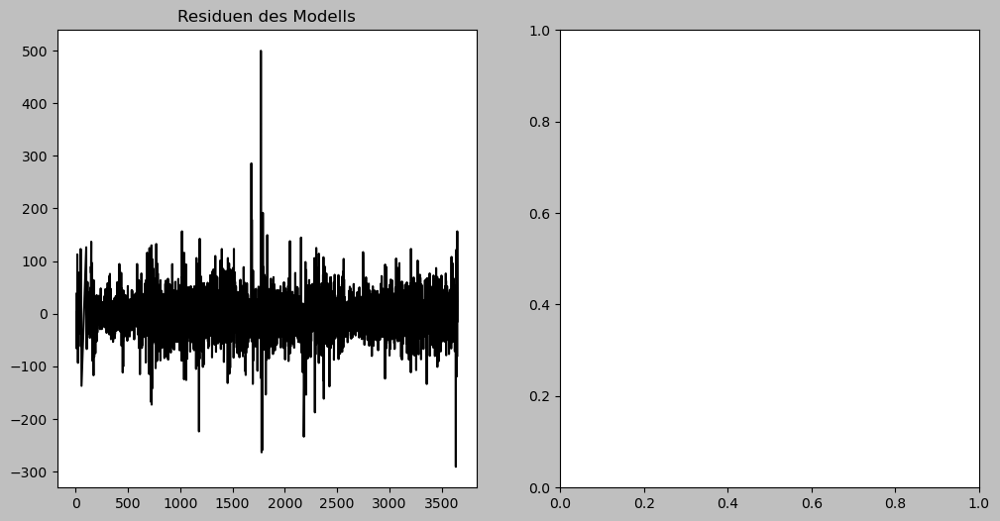

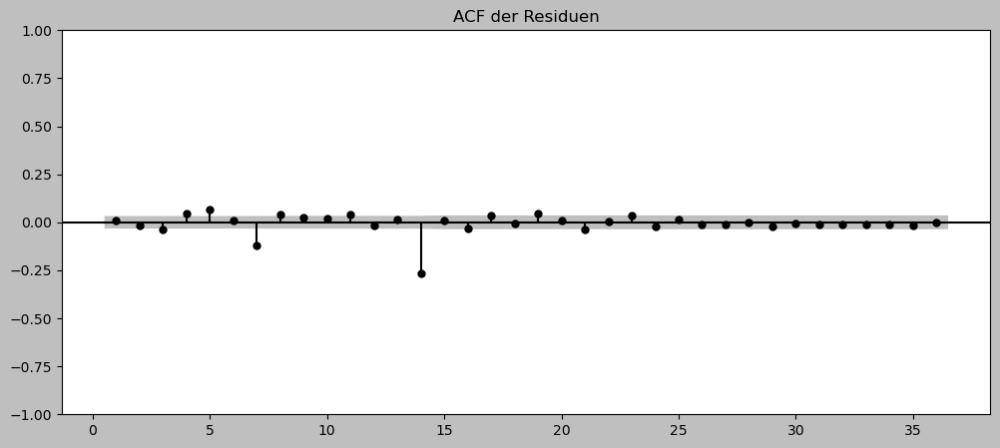

In [31]:
# SARIMA Modell für df_daily
model = SARIMAX(daily_diff_7, 
                order=(1, 0, 1), 
                seasonal_order=(1, 1, 1, 7)).fit(disp=False)

print(model.summary())

# Plot der Residuen
# Die Residuen sollten keine offensichtliche Struktur mehr haben (zufällig um 0 verteilt).
# Die ACF der Residuen sollte für alle Lags innerhalb des Konfidenzintervalls (grauer Bereich) liegen.
residuals = model.resid
plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.plot(residuals)
plt.title("Residuen des Modells")
plt.subplot(122)
plot_acf(residuals, zero=False, lags=36)
plt.title("ACF der Residuen")
plt.show()

Im Vergleich dazu schneidet dieses Modell in allen Kriterien deutlich besser ab und kann als solides Modell bezeichnet werden. Es bleibt weiterhin das Problem, dass im ACF Plot die zyklischen Ausreißer bei 7 und 14 zu finden sind. Als nächsten Schritt wird jetzt den saisonalen Parametern mehr Gewichtung gegeben. 

                                       SARIMAX Results                                        
Dep. Variable:                                  calls   No. Observations:                 3586
Model:             SARIMAX(1, 0, 1)x(2, 1, [1, 2], 7)   Log Likelihood              -18062.136
Date:                                Mon, 06 Jan 2025   AIC                          36138.273
Time:                                        12:02:09   BIC                          36181.553
Sample:                                             0   HQIC                         36153.701
                                               - 3586                                         
Covariance Type:                                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9321      0.008    117.887      0.000       0.917       0.948
ma.

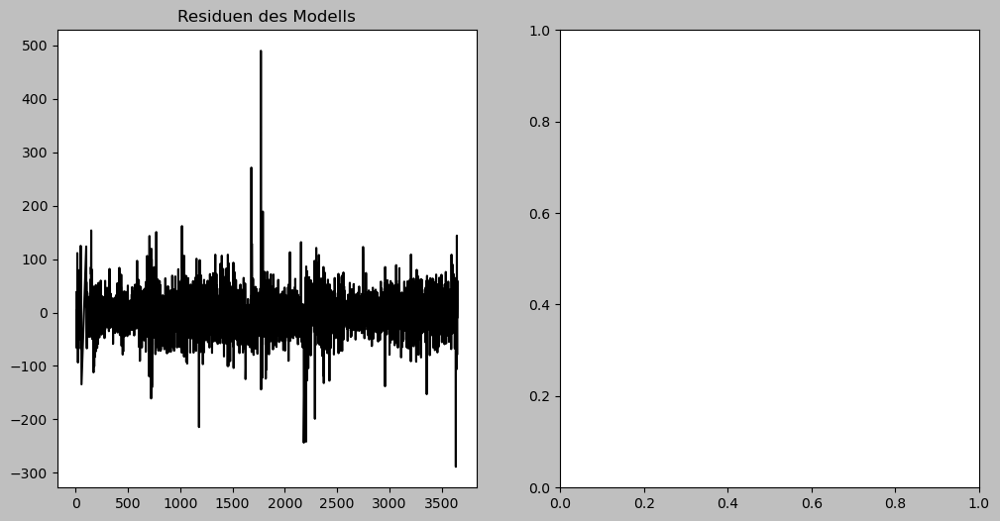

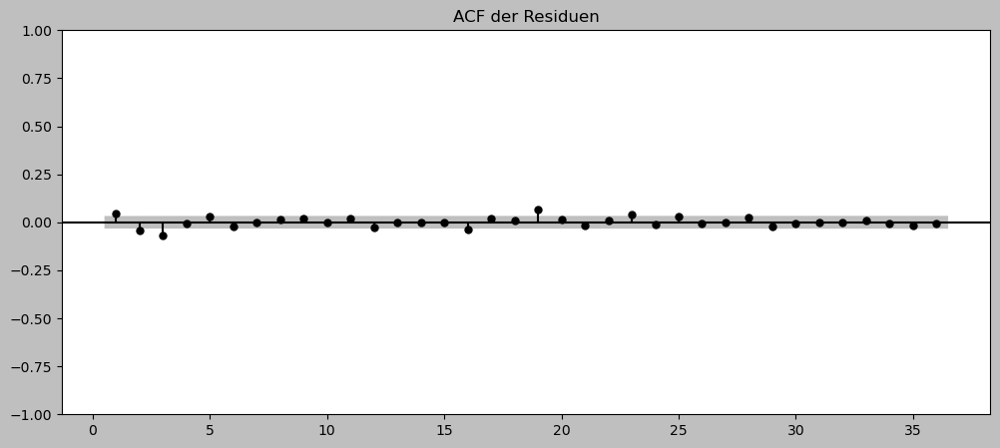

In [ ]:
# SARIMA Modell für df_daily
model = SARIMAX(daily_diff_7, 
                order=(1, 0, 1), 
                seasonal_order=(2, 1, 2, 7)).fit(disp=False)

print(model.summary())

# Plot der Residuen
# Die Residuen sollten keine offensichtliche Struktur mehr haben (zufällig um 0 verteilt).
# Die ACF der Residuen sollte für alle Lags innerhalb des Konfidenzintervalls (grauer Bereich) liegen.
residuals = model.resid
plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.plot(residuals)
plt.title("Residuen des Modells")
plt.subplot(122)
plot_acf(residuals, zero=False, lags=36)
plt.title("ACF der Residuen")
plt.show()

Das scheint bisher das beste Modell zu sein.

                                     SARIMAX Results                                     
Dep. Variable:                             calls   No. Observations:                 3586
Model:             SARIMAX(1, 0, 1)x(1, 2, 1, 7)   Log Likelihood                -706.318
Date:                           Mon, 06 Jan 2025   AIC                           1422.636
Time:                                   11:10:00   BIC                           1453.541
Sample:                                        0   HQIC                          1433.654
                                          - 3586                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9999   6.75e-07   1.48e+06      0.000       1.000       1.000
ma.L1         -0.9996      0.001  -1804.673

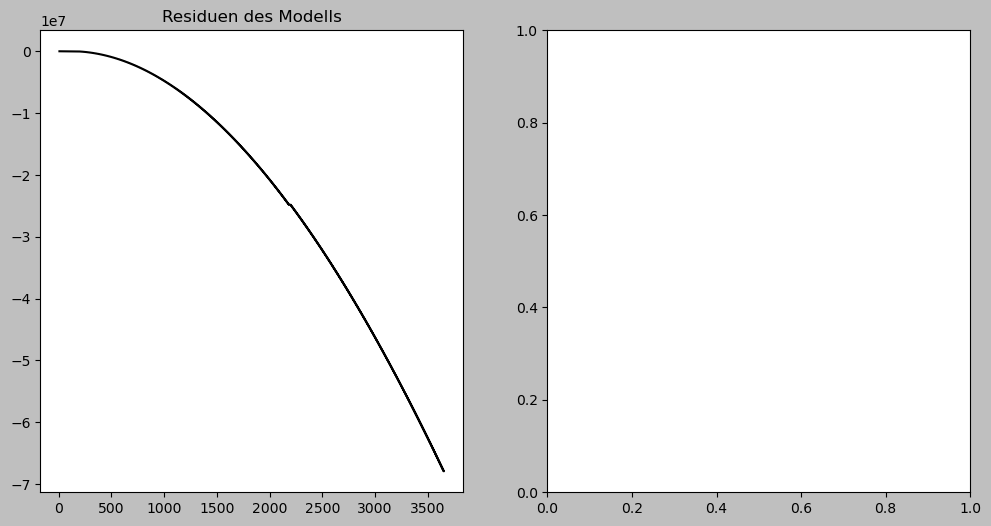

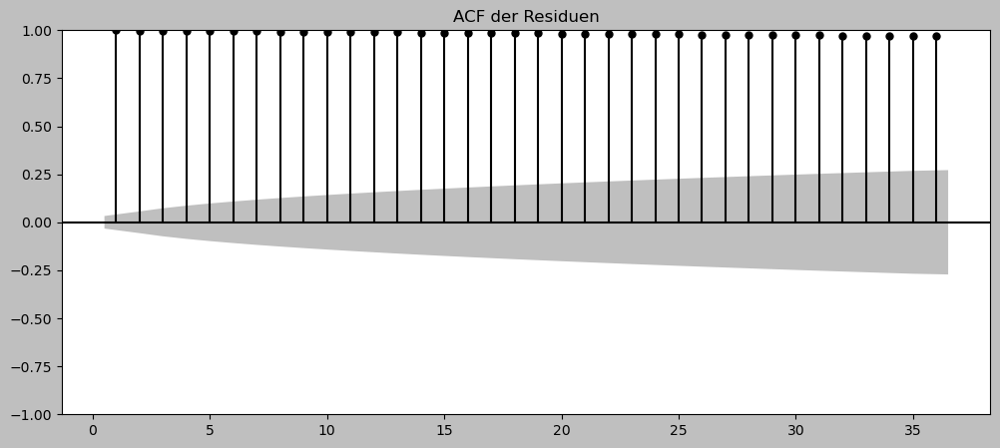

In [30]:
# SARIMA Modell für df_daily
model = SARIMAX(daily_diff_7, 
                order=(1, 0, 1), 
                seasonal_order=(1, 2, 1, 7)).fit(disp=False)

print(model.summary())
# Plot der Residuen
# Die Residuen sollten keine offensichtliche Struktur mehr haben (zufällig um 0 verteilt).
# Die ACF der Residuen sollte für alle Lags innerhalb des Konfidenzintervalls (grauer Bereich) liegen.
residuals = model.resid
plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.plot(residuals)
plt.title("Residuen des Modells")
plt.subplot(122)
plot_acf(residuals, zero=False, lags=36)
plt.title("ACF der Residuen")
plt.show()

Den Test D auf 2 zu erhöhen, um komplexere Muster einzubinden, hat nicht funktioniert. Bereits am ACF Plot sieht man, dass die Werte stark von den erwarteten abweichen.

                                       SARIMAX Results                                        
Dep. Variable:                                  calls   No. Observations:                 3604
Model:             SARIMAX(1, 0, 1)x(2, 1, [1, 2], 7)   Log Likelihood              -18042.944
Date:                                Mon, 06 Jan 2025   AIC                          36099.888
Time:                                        12:08:01   BIC                          36143.203
Sample:                                             0   HQIC                         36115.325
                                               - 3604                                         
Covariance Type:                                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2044      0.019     10.516      0.000       0.166       0.242
ma.

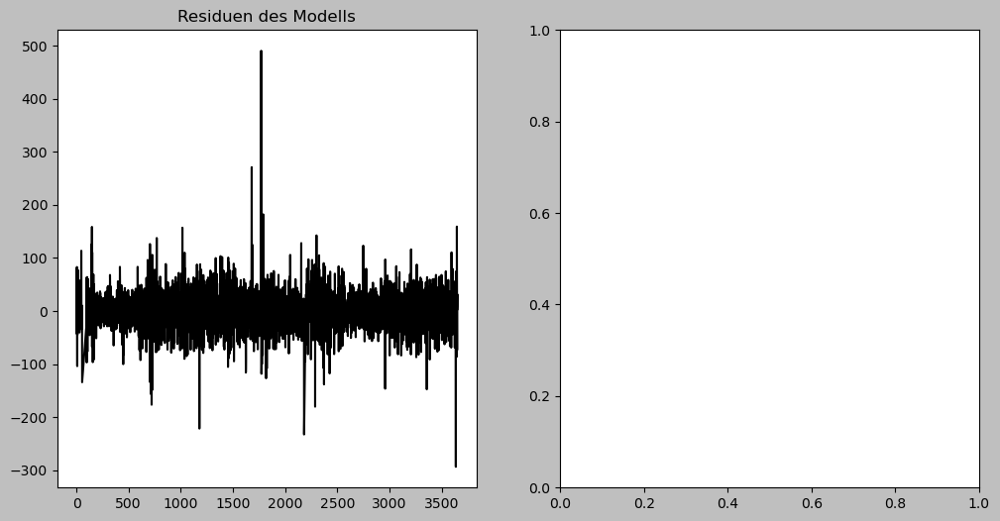

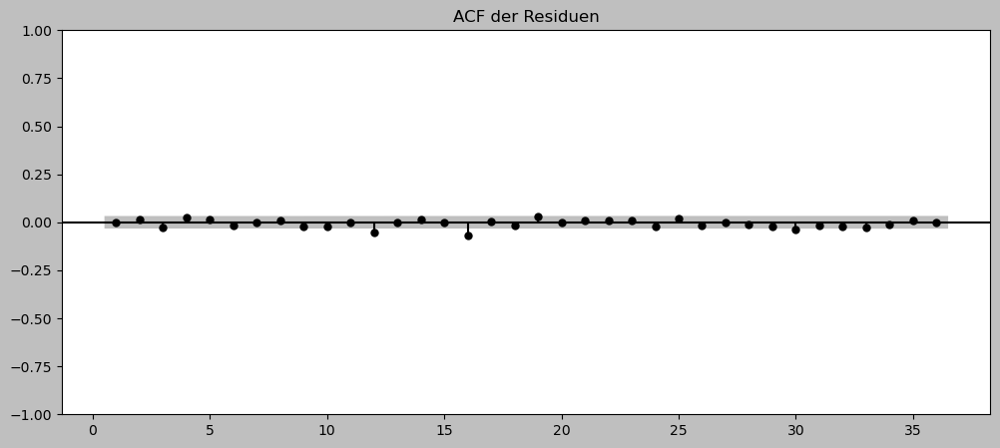

In [34]:
# SARIMA Modell für df_daily
model = SARIMAX(daily_diff, 
                order=(1, 0, 1), 
                seasonal_order=(2, 1, 2, 7)).fit(disp=False)

print(model.summary())
# Plot der Residuen
# Die Residuen sollten keine offensichtliche Struktur mehr haben (zufällig um 0 verteilt).
# Die ACF der Residuen sollte für alle Lags innerhalb des Konfidenzintervalls (grauer Bereich) liegen.
residuals = model.resid
plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.plot(residuals)
plt.title("Residuen des Modells")
plt.subplot(122)
plot_acf(residuals, zero=False, lags=36)
plt.title("ACF der Residuen")
plt.show()

### Hyperparameteroptimierung mit Optuna

In [37]:
import optuna
from statsmodels.tsa.statespace.sarimax import SARIMAX

In [38]:
def objective(trial, data, s):
    # Hyperparameter-Räume definieren
    p = trial.suggest_int("p", 0, 2)
    d = trial.suggest_int("d", 0, 1)  # Stationarity: meist nur 0 oder 1 sinnvoll
    q = trial.suggest_int("q", 0, 2)
    P = trial.suggest_int("P", 0, 2)
    D = trial.suggest_int("D", 0, 1)  # Saisonale Differenzierung: meist 0 oder 1 sinnvoll
    Q = trial.suggest_int("Q", 0, 2)

    try:
        # SARIMA-Modell trainieren
        model = SARIMAX(data, order=(p, d, q),
                        seasonal_order=(P, D, Q, s)).fit(disp=False)
        # Optimierung basierend auf dem Akaike-Informationskriterium (AIC)
        return model.aic
    except Exception as e:
        # Rückgabe von "unendlich", falls das Modell fehlschlägt
        return float("inf")

# Funktion zur Optimierung für unterschiedliche Datensätze und saisonale Werte
def optimize_sarima(data, s, n_trials=50):
    print(f"Starte Optimierung für s={s} mit {n_trials} Trials...")
    study = optuna.create_study(direction="minimize")
    study.optimize(lambda trial: objective(trial, data, s), n_trials=n_trials)
    print("Beste Parameter:", study.best_params)
    return study.best_params

In [39]:

# Beispiel: Optimierung für hourly_diff_24 und daily_diff_7
best_params_hourly = optimize_sarima(hourly_diff_24, s=24, n_trials=50)
best_params_daily = optimize_sarima(daily_diff_7, s=7, n_trials=50)

print("Optimale Parameter für hourly_diff_24:", best_params_hourly)
print("Optimale Parameter für daily_diff_7:", best_params_daily)

[I 2025-01-14 22:31:12,722] A new study created in memory with name: no-name-555e745d-7417-4172-a23e-78da9007cf06


Starte Optimierung für s=24 mit 50 Trials...


[I 2025-01-14 22:31:20,382] Trial 0 finished with value: 230774.54062797411 and parameters: {'p': 1, 'd': 1, 'q': 1, 'P': 0, 'D': 1, 'Q': 0}. Best is trial 0 with value: 230774.54062797411.
[I 2025-01-14 22:36:49,880] Trial 1 finished with value: 176199.13834692724 and parameters: {'p': 1, 'd': 1, 'q': 2, 'P': 2, 'D': 0, 'Q': 1}. Best is trial 1 with value: 176199.13834692724.
[I 2025-01-14 23:07:07,899] Trial 2 finished with value: 177974.45511738845 and parameters: {'p': 1, 'd': 1, 'q': 2, 'P': 1, 'D': 1, 'Q': 2}. Best is trial 1 with value: 176199.13834692724.
[I 2025-01-14 23:07:32,157] Trial 3 finished with value: 212604.180229676 and parameters: {'p': 0, 'd': 0, 'q': 2, 'P': 1, 'D': 1, 'Q': 0}. Best is trial 1 with value: 176199.13834692724.
[I 2025-01-14 23:08:57,411] Trial 4 finished with value: 183825.80544583633 and parameters: {'p': 1, 'd': 1, 'q': 0, 'P': 2, 'D': 0, 'Q': 1}. Best is trial 1 with value: 176199.13834692724.
[I 2025-01-14 23:09:17,159] Trial 5 finished with va

Beste Parameter: {'p': 1, 'd': 1, 'q': 2, 'P': 1, 'D': 0, 'Q': 1}
Starte Optimierung für s=7 mit 50 Trials...


[I 2025-01-15 00:47:09,920] Trial 0 finished with value: 36322.68494775261 and parameters: {'p': 2, 'd': 0, 'q': 0, 'P': 1, 'D': 0, 'Q': 1}. Best is trial 0 with value: 36322.68494775261.
[I 2025-01-15 00:47:11,738] Trial 1 finished with value: 37828.54093746451 and parameters: {'p': 1, 'd': 0, 'q': 1, 'P': 0, 'D': 1, 'Q': 1}. Best is trial 0 with value: 36322.68494775261.
[I 2025-01-15 00:47:11,900] Trial 2 finished with value: 41673.00939240945 and parameters: {'p': 0, 'd': 0, 'q': 1, 'P': 0, 'D': 1, 'Q': 0}. Best is trial 0 with value: 36322.68494775261.
[I 2025-01-15 00:47:15,925] Trial 3 finished with value: 36959.00612344383 and parameters: {'p': 2, 'd': 1, 'q': 2, 'P': 1, 'D': 1, 'Q': 1}. Best is trial 0 with value: 36322.68494775261.
[I 2025-01-15 00:47:16,526] Trial 4 finished with value: 37325.53817580859 and parameters: {'p': 2, 'd': 1, 'q': 0, 'P': 1, 'D': 0, 'Q': 0}. Best is trial 0 with value: 36322.68494775261.
[I 2025-01-15 00:47:16,810] Trial 5 finished with value: 374

Beste Parameter: {'p': 1, 'd': 1, 'q': 2, 'P': 2, 'D': 0, 'Q': 2}
Optimale Parameter für hourly_diff_24: {'p': 1, 'd': 1, 'q': 2, 'P': 1, 'D': 0, 'Q': 1}
Optimale Parameter für daily_diff_7: {'p': 1, 'd': 1, 'q': 2, 'P': 2, 'D': 0, 'Q': 2}


### Exponentielle Glättung

In [27]:
def exponential_smoothing(series, alpha):
    """
        series - dataset with timestamps
        alpha - float [0.0, 1.0], smoothing parameter
    """
    result = [series[0]] # first value is same as series
    for n in range(1, len(series)):
        result.append(alpha * series[n] + (1 - alpha) * result[n-1])
    return result

In [28]:
def plotExponentialSmoothing(series, alphas):
    """
        Plots exponential smoothing with different alphas
        
        series - dataset with timestamps
        alphas - list of floats, smoothing parameters
        
    """
    with plt.style.context('seaborn-v0_8-white'):    
        plt.figure(figsize=(15, 7))
        plt.plot(series.values, "c", label = "Actual")
        for alpha in alphas:
            plt.plot(exponential_smoothing(series, alpha), label="Alpha {}".format(alpha))
        plt.legend(loc="best")
        plt.axis('tight')
        plt.title("Exponential Smoothing")
        plt.grid(True);

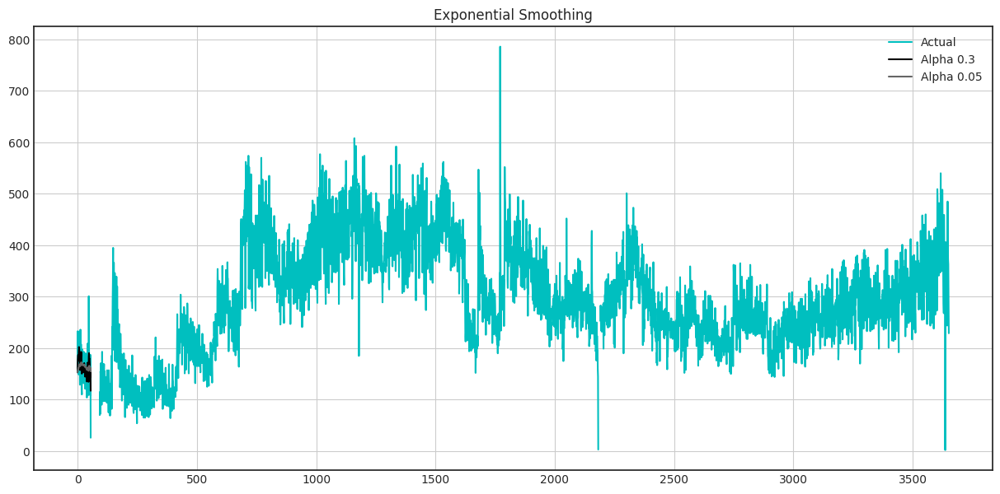

In [29]:
plotExponentialSmoothing(df_daily.calls, [0.3, 0.05])

Alpha ist der Glättungs-Faktor. Je kleiner alpha ist, desto mehr Einfluss haben die vorherigen Ereignisse im Vergleich zum momentanen Ereignis.


## Double exponential smoothing


In [30]:
def double_exponential_smoothing(series, alpha, beta):
    """
        series - dataset with timeseries
        alpha - float [0.0, 1.0], smoothing parameter for level
        beta - float [0.0, 1.0], smoothing parameter for trend
    """
    # first value is same as series
    result = [series[0]]
    for n in range(1, len(series)+1):
        if n == 1:
            level, trend = series[0], series[1] - series[0]
        if n >= len(series): # forecasting
            value = result[-1]
        else:
            value = series[n]
        last_level, level = level, alpha*value + (1-alpha)*(level+trend)
        trend = beta*(level-last_level) + (1-beta)*trend
        result.append(level+trend)
    return result

def plotDoubleExponentialSmoothing(series, alphas, betas):
    """
        Plots double exponential smoothing with different alphas and betas
        
        series - dataset with timestamps
        alphas - list of floats, smoothing parameters for level
        betas - list of floats, smoothing parameters for trend
    """
    
    with plt.style.context('seaborn-v0_8-white'):    
        plt.figure(figsize=(20, 8))
        plt.plot(series.values, label = "Actual")
        for alpha in alphas:
            for beta in betas:
                plt.plot(double_exponential_smoothing(series, alpha, beta), label="Alpha {}, beta {}".format(alpha, beta))
        plt.legend(loc="best")
        plt.axis('tight')
        plt.title("Double Exponential Smoothing")
        plt.grid(True)

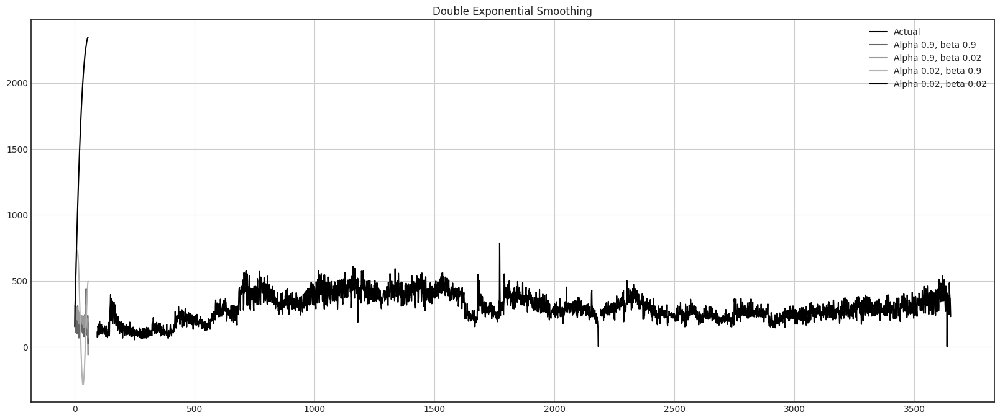

In [31]:
plotDoubleExponentialSmoothing(df_daily.calls, alphas=[0.9, 0.02], betas=[0.9, 0.02])

Die doppelte Exponentielle Glättung beinhaltet die Komponenten Level und Trend. 

### Triple Exponential Smoothing aka Holt-Winters

Dieses Verfahren berücksichtigt nicht nur Level und Trend, sondern auch Season/Saison.

In [32]:
class HoltWinters:
    """
    Holt-Winters model with the anomalies detection using Brutlag method
    
    # series - initial time series
    # slen - length of a season
    # alpha, beta, gamma - Holt-Winters model coefficients
    # n_preds - predictions horizon
    # scaling_factor - sets the width of the confidence interval by Brutlag (usually takes values from 2 to 3)
    """
    
    def __init__(self, series, slen, alpha, beta, gamma, n_preds, scaling_factor=1.96):
        self.series = series
        self.slen = slen
        self.alpha = alpha
        self.beta = beta
        self.gamma = gamma
        self.n_preds = n_preds
        self.scaling_factor = scaling_factor
        
    def initial_trend(self):
        sum = 0.0
        for i in range(self.slen):
            sum += float(self.series[i+self.slen] - self.series[i]) / self.slen
        return sum / self.slen  
    
    def initial_seasonal_components(self):
        seasonals = {}
        season_averages = []
        n_seasons = int(len(self.series)/self.slen)
        # let's calculate season averages
        for j in range(n_seasons):
            season_averages.append(sum(self.series[self.slen*j:self.slen*j+self.slen])/float(self.slen))
        # let's calculate initial values
        for i in range(self.slen):
            sum_of_vals_over_avg = 0.0
            for j in range(n_seasons):
                sum_of_vals_over_avg += self.series[self.slen*j+i]-season_averages[j]
            seasonals[i] = sum_of_vals_over_avg/n_seasons
        return seasonals   
      
    def triple_exponential_smoothing(self):
        self.result = []
        self.Smooth = []
        self.Season = []
        self.Trend = []
        self.PredictedDeviation = []
        self.UpperBond = []
        self.LowerBond = []
        
        seasonals = self.initial_seasonal_components()
        
        for i in range(len(self.series)+self.n_preds):
            if i == 0: # components initialization
                smooth = self.series[0]
                trend = self.initial_trend()
                self.result.append(self.series[0])
                self.Smooth.append(smooth)
                self.Trend.append(trend)
                self.Season.append(seasonals[i%self.slen])
                
                self.PredictedDeviation.append(0)
                
                self.UpperBond.append(self.result[0] + 
                                      self.scaling_factor * 
                                      self.PredictedDeviation[0])
                
                self.LowerBond.append(self.result[0] - 
                                      self.scaling_factor * 
                                      self.PredictedDeviation[0])
                continue
                
            if i >= len(self.series): # predicting
                m = i - len(self.series) + 1
                self.result.append((smooth + m*trend) + seasonals[i%self.slen])
                
                # when predicting we increase uncertainty on each step
                self.PredictedDeviation.append(self.PredictedDeviation[-1]*1.01) 
                
            else:
                val = self.series[i]
                last_smooth, smooth = smooth, self.alpha*(val-seasonals[i%self.slen]) + (1-self.alpha)*(smooth+trend)
                trend = self.beta * (smooth-last_smooth) + (1-self.beta)*trend
                seasonals[i%self.slen] = self.gamma*(val-smooth) + (1-self.gamma)*seasonals[i%self.slen]
                self.result.append(smooth+trend+seasonals[i%self.slen])
                
                # Deviation is calculated according to Brutlag algorithm.
                self.PredictedDeviation.append(self.gamma * np.abs(self.series[i] - self.result[i]) 
                                               + (1-self.gamma)*self.PredictedDeviation[-1])
                     
            self.UpperBond.append(self.result[-1] + 
                                  self.scaling_factor * 
                                  self.PredictedDeviation[-1])

            self.LowerBond.append(self.result[-1] - 
                                  self.scaling_factor * 
                                  self.PredictedDeviation[-1])

            self.Smooth.append(smooth)
            self.Trend.append(trend)
            self.Season.append(seasonals[i%self.slen])

### Time Series Cross Validation

In [67]:
from sklearn.model_selection import TimeSeriesSplit # you have everything done for you

def timeseriesCVscore(params, series, loss_function=mean_squared_error, slen=24):
    """
        Returns error on CV  
        
        params - vector of parameters for optimization
        series - dataset with timeseries
        slen - season length for Holt-Winters model
    """
    # errors array
    errors = []
    
    values = series.values
    alpha, beta, gamma = params
    
    # set the number of folds for cross-validation
    tscv = TimeSeriesSplit(n_splits=3) 
    
    # iterating over folds, train model on each, forecast and calculate error
    for train, test in tscv.split(values):
        model = HoltWinters(series=values[train], slen=slen, 
                            alpha=alpha, beta=beta, gamma=gamma, n_preds=len(test))
        model.triple_exponential_smoothing()
        
        predictions = model.result[-len(test):]
        actual = values[test]
        error = loss_function(actual, predictions)
        errors.append(error)
        
    return np.mean(np.array(errors))

In [71]:
%%time
data = df_daily.calls[:-20] # leave some data for testing

# initializing model parameters alpha, beta and gamma
x = [0, 0, 0] 

# Minimizing the loss function
opt = minimize(timeseriesCVscore, x0=x, 
               args=(data, mean_squared_log_error), 
               method="TNC", bounds = ((0, 1), (0, 1), (0, 1))
              )

# Take optimal values...
alpha_final, beta_final, gamma_final = opt.x
print(alpha_final, beta_final, gamma_final)

# ...and train the model with them, forecasting for the next 50 hours
model = HoltWinters(data, slen = 24, 
                    alpha = alpha_final, 
                    beta = beta_final, 
                    gamma = gamma_final, 
                    n_preds = 50, scaling_factor = 3)
model.triple_exponential_smoothing()

0.0 0.0 0.0
CPU times: total: 188 ms
Wall time: 180 ms


In [72]:
from sklearn.metrics import mean_squared_error
from scipy.optimize import minimize
import numpy as np
import pandas as pd

# Check for negative values
negative_values = df_daily.calls[df_daily.calls < 0]
print(f"Negative values in calls: {negative_values}")

if len(negative_values) > 0:
    raise ValueError("The data contains negative values, which is not suitable for mean_squared_log_error.")

def timeseriesCVscore(params, series, loss_function=mean_squared_error, slen=24):
    """
        Returns error on CV  
        
        params - vector of parameters for optimization
        series - dataset with timeseries
        slen - season length for Holt-Winters model
    """
    # errors array
    errors = []
    
    values = series.values
    alpha, beta, gamma = params
    
    # set the number of folds for cross-validation
    tscv = TimeSeriesSplit(n_splits=3) 
    
    # iterating over folds, train model on each, forecast and calculate error
    for train, test in tscv.split(values):
        model = HoltWinters(series=values[train], slen=slen, 
                            alpha=alpha, beta=beta, gamma=gamma, n_preds=len(test))
        model.triple_exponential_smoothing()
        
        predictions = model.result[-len(test):]
        actual = values[test]
        error = loss_function(actual, predictions)
        errors.append(error)
        
    return np.mean(np.array(errors))

data = df_daily.calls[:-20]  # Belassen Sie einige Daten zum Testen

# Initialisieren Sie die Modellparameter alpha, beta und gamma
x = [0, 0, 0] 

# Minimieren Sie die Verlustfunktion
opt = minimize(timeseriesCVscore, x0=x, 
               args=(data, mean_squared_error), 
               method="TNC", bounds = ((0, 1), (0, 1), (0, 1))
              )

# Nehmen Sie die optimalen Werte...
alpha_final, beta_final, gamma_final = opt.x
print(alpha_final, beta_final, gamma_final)

# ...und trainieren Sie das Modell mit ihnen, indem Sie die nächsten 50 Stunden vorhersagen
model = HoltWinters(data, slen = 24, 
                    alpha = alpha_final, 
                    beta = beta_final, 
                    gamma = gamma_final, 
                    n_preds = 50, scaling_factor = 3)
model.triple_exponential_smoothing()

Negative values in calls: Series([], Name: calls, dtype: float64)


ValueError: Input contains NaN.

In [37]:
def plotHoltWinters(series, plot_intervals=False, plot_anomalies=False):
    """
        series - dataset with timeseries
        plot_intervals - show confidence intervals
        plot_anomalies - show anomalies 
    """
    
    plt.figure(figsize=(20, 10))
    plt.plot(series.values, label = "Actual")
    plt.plot(model.result, label = "Model")
    error = mean_absolute_percentage_error(series.values, model.result[:len(series)])
    plt.title("Mean Absolute Percentage Error: {0:.2f}%".format(error))
    
    if plot_anomalies:
        anomalies = np.array([np.NaN]*len(series))
        anomalies[series.values<model.LowerBond[:len(series)]] = \
            series.values[series.values<model.LowerBond[:len(series)]]
        anomalies[series.values>model.UpperBond[:len(series)]] = \
            series.values[series.values>model.UpperBond[:len(series)]]
        plt.plot(anomalies, "o", markersize=10, label = "Anomalies")
    
    if plot_intervals:
        plt.plot(model.UpperBond, "r--", alpha=0.5, label = "Up/Low confidence")
        plt.plot(model.LowerBond, "r--", alpha=0.5)
        plt.fill_between(x=range(0,len(model.result)), y1=model.UpperBond, 
                         y2=model.LowerBond, alpha=0.2, color = "grey")    
        
    plt.vlines(len(series), ymin=min(model.LowerBond), ymax=max(model.UpperBond), linestyles='dashed')
    plt.axvspan(len(series)-20, len(model.result), alpha=0.3, color='lightgrey')
    plt.grid(True)
    plt.axis('tight')
    plt.legend(loc="best", fontsize=13)

NameError: name 'mean_absolute_percentage_error' is not defined

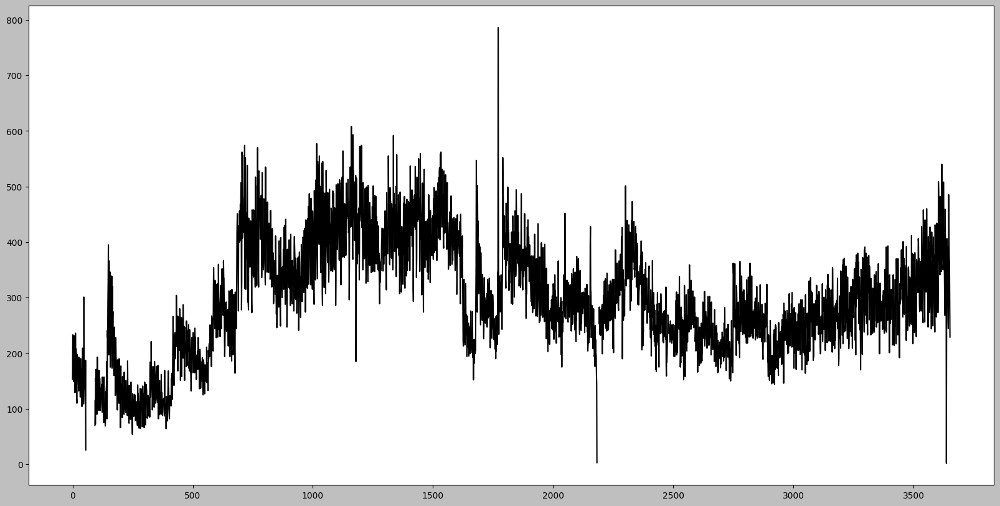

In [74]:
plotHoltWinters(df_daily.calls, plot_intervals=True, plot_anomalies=True)

Text(0.5, 1.0, "Brutlag's predicted deviation")

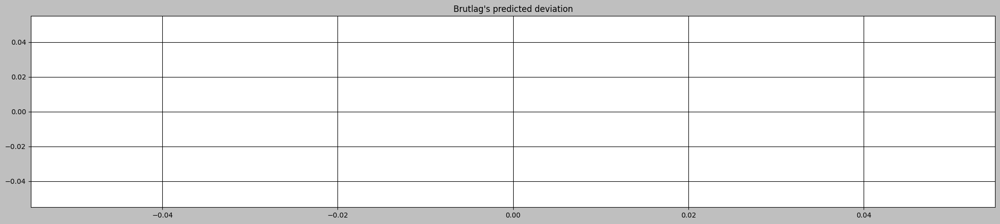

In [73]:
plt.figure(figsize=(25, 5))
plt.plot(model.PredictedDeviation)
plt.grid(True)
plt.axis('tight')
plt.title("Brutlag's predicted deviation")

## Econometric approach

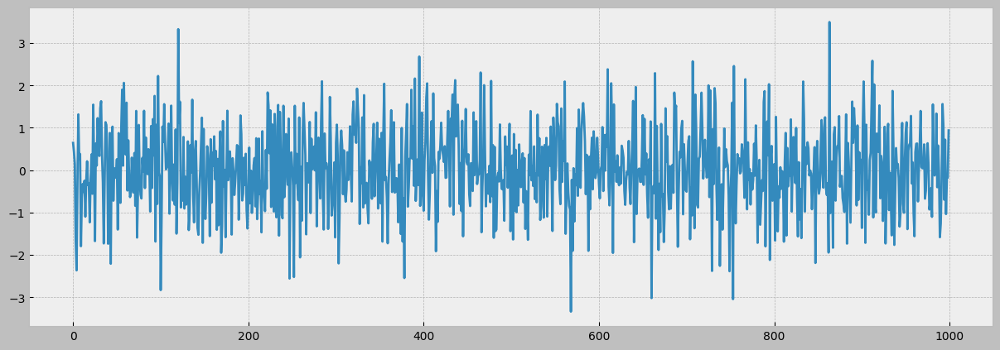

In [40]:
white_noise = np.random.normal(size=1000)
with plt.style.context('bmh'):  
    plt.figure(figsize=(15, 5))
    plt.plot(white_noise)

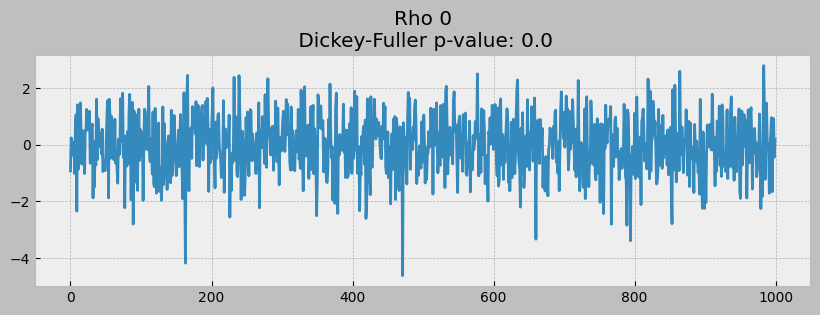

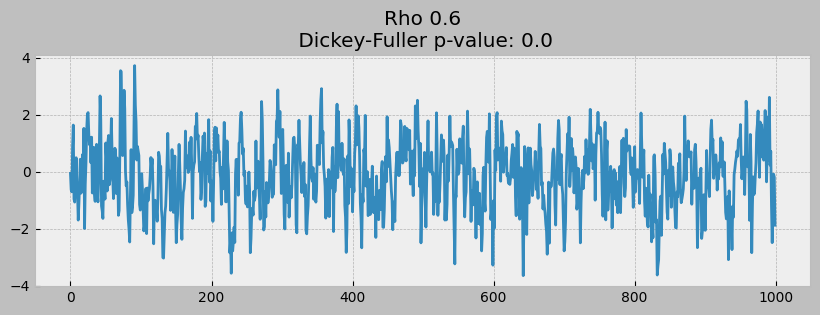

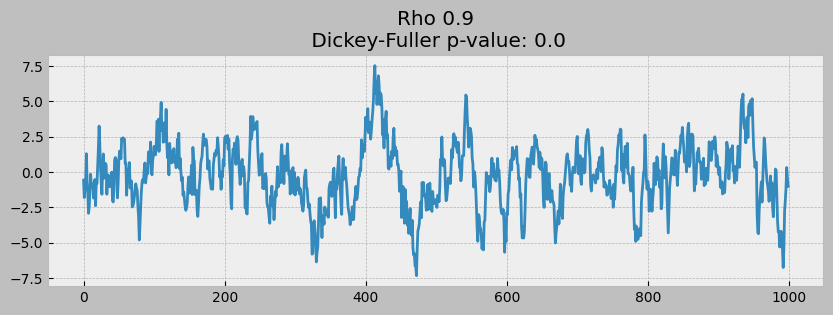

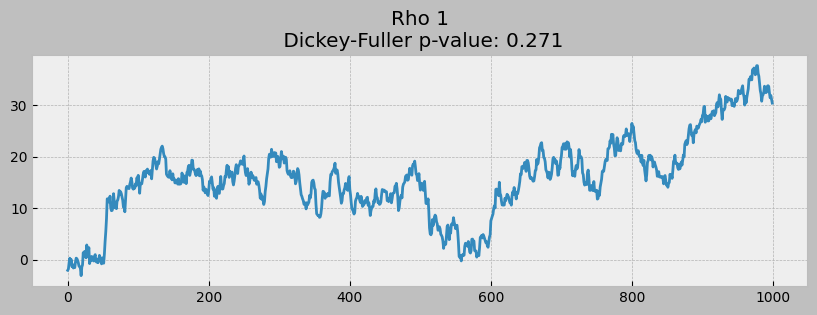

In [41]:
def plotProcess(n_samples=1000, rho=0):
    x = w = np.random.normal(size=n_samples)
    for t in range(n_samples):
        x[t] = rho * x[t-1] + w[t]

    with plt.style.context('bmh'):  
        plt.figure(figsize=(10, 3))
        plt.plot(x)
        plt.title("Rho {}\n Dickey-Fuller p-value: {}".format(rho, round(sm.tsa.stattools.adfuller(x)[1], 3)))
        
for rho in [0, 0.6, 0.9, 1]:
    plotProcess(rho=rho)

### Getting rid of non-stationarity and building SARIMA

In [42]:
def tsplot(y, lags=None, figsize=(12, 7), style='bmh'):
    """
        Plot time series, its ACF (Autorcorrelation Function) and PACF (Partial Autocorrelation Function), calculate Dickey–Fuller test
        
        y - timeseries
        lags - how many lags to include in ACF, PACF calculation
    """
    if not isinstance(y, pd.Series):
        y = pd.Series(y)
        
    with plt.style.context(style):    
        fig = plt.figure(figsize=figsize)
        layout = (2, 2)
        ts_ax = plt.subplot2grid(layout, (0, 0), colspan=2)
        acf_ax = plt.subplot2grid(layout, (1, 0))
        pacf_ax = plt.subplot2grid(layout, (1, 1))
        
        y.plot(ax=ts_ax)
        p_value = sm.tsa.stattools.adfuller(y)[1]
        ts_ax.set_title('Time Series Analysis Plots\n Dickey-Fuller: p={0:.5f}'.format(p_value))
        smt.graphics.plot_acf(y, lags=lags, ax=acf_ax)
        smt.graphics.plot_pacf(y, lags=lags, ax=pacf_ax)
        plt.tight_layout()

MissingDataError: exog contains inf or nans

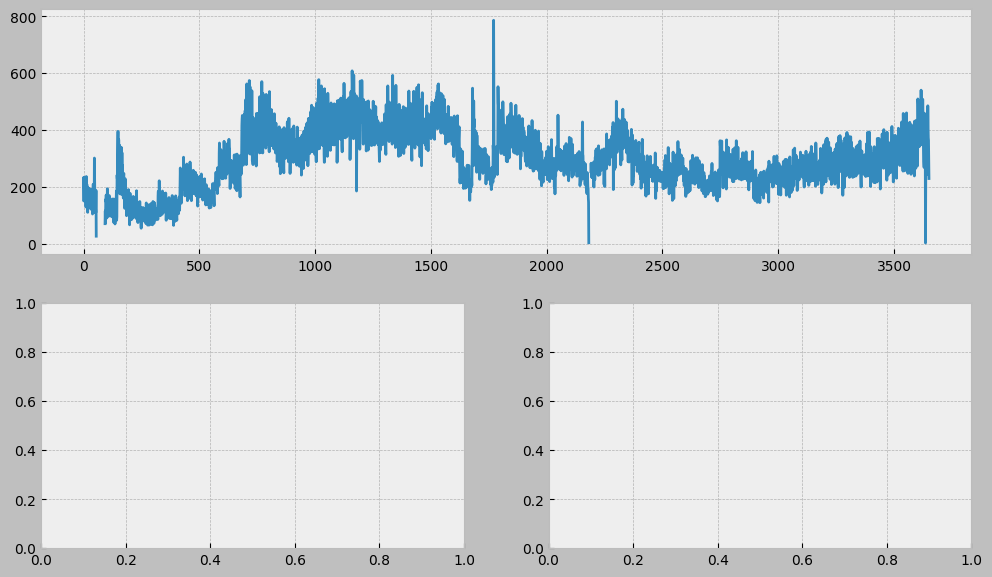

In [75]:
tsplot(df_daily.calls, lags=60)

MissingDataError: exog contains inf or nans

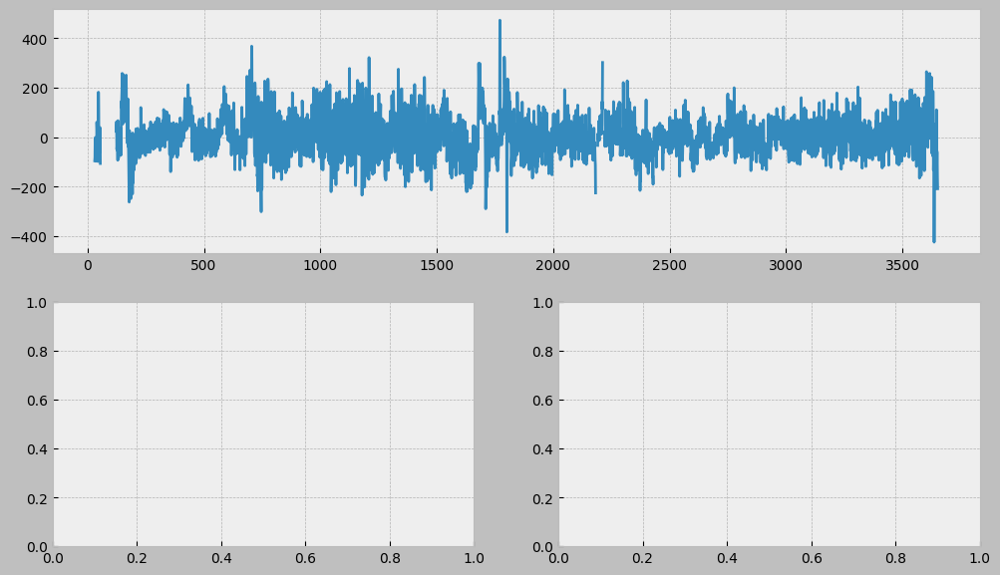

In [44]:
df_diff = df_daily.calls - df_daily.calls.shift(30) # shift: um dreißig Tage versetzte Werte
tsplot(df_diff[30+1:], lags=70)

## ARIMA-Family Crashcourse

***AR(p)*** Regression der Zeitreihe auf sich selbst.  
Grundannahme: aktuelle Werte hängen mit gewisser Verzögerung von früheren Werten ab.  
Maximale Verzögerung ist *p*, um das erste zu finden müssen wir in der PACF die größte signifikante Veränderung finden nach der die meisten anderen unbedeutend werden.  
  
***MA(q)*** Modell des gleitenden Durchschnitts - Modellierung des Fehlers in der Zeitreihe.  
Grundannahme: aktueller Fehler vom verherigen mit gewisser Verzögerung abhängig.  
Maximal Verzögerung des Fehlers ist *q*, kann ebenfalls damit gefunden werden, das der erste signifikante Werte, aber in ACF bestimmt wird.  
  
***I(d)*** Integrationsordnung. Anzahl der nicht saisonalen Differenzen für eine stationäre Reihe.  
Kann 1 oder 0 sein, je nachdem ob Saisonalität angewandt wurde oder nicht.  
  
***S(s)*** Saisonalität. Länge der Saisonperiode der Reihe.  
  
***P***  
  
***Q***  
  
***D***  



--------

***p*** wahrscheinlich **7**, da danach die Punkte weniger signifikant sind  
***d*** ist **1**, da es saisonale Unterschiede gibt  
***q*** auch hier könnte es **7** sein, da die folgenden Datenpunkte weniger signifikant sind  


In [ ]:
ps = range(2, 5)
d=1 
qs = range(2, 5)
Ps = range(0, 2)
D=1 
Qs = range(0, 2)
s = 24 # season length is still 24

# creating list with all the possible combinations of parameters
parameters = product(ps, qs, Ps, Qs)
parameters_list = list(parameters)
len(parameters_list)

36

In [ ]:
def optimizeSARIMA(parameters_list, d, D, s):
    """
    Return dataframe with parameters and corresponding AIC
    
    parameters_list - list with (p, q, P, Q) tuples
    d - integration order in ARIMA model
    D - seasonal integration order 
    s - length of season
    """
    
    results = []
    best_aic = float("inf")

    for param in tqdm(parameters_list):
        # we need try-except because on some combinations model fails to converge
        try:
            model = sm.tsa.statespace.SARIMAX(df_daily.calls, 
                                              order=(param[0], d, param[1]), 
                                              seasonal_order=(param[2], D, param[3], s)).fit(disp=False)
        except Exception as e:
            print(f"Exception for parameters {param}: {e}")
            continue
        
        aic = model.aic
        # saving best model, AIC and parameters
        if aic < best_aic:
            best_model = model
            best_aic = aic
            best_param = param
        results.append([param, model.aic])

    result_table = pd.DataFrame(results, columns=['parameters', 'aic'])
    # sorting in ascending order, the lower AIC is - the better
    result_table = result_table.sort_values(by='aic', ascending=True).reset_index(drop=True)
    
    return result_table


In [ ]:
%%time
result_table = optimizeSARIMA(parameters_list, d, D, s)

100%|██████████| 36/36 [46:53<00:00, 78.14s/it] 


CPU times: total: 1h 19min 18s
Wall time: 46min 53s


In [ ]:
result_table.head()

,parameters,aic
0,"(4, 3, 0, 1)",46096.395198
1,"(4, 3, 1, 1)",46125.271681
2,"(4, 2, 0, 1)",46220.706677
3,"(4, 2, 1, 1)",46239.849865
4,"(2, 2, 1, 1)",46256.373395


In [ ]:
p, q, P, Q = result_table.parameters[0]

best_model=sm.tsa.statespace.SARIMAX(df_daily.calls, order=(p, d, q), 
                                        seasonal_order=(P, D, Q, s)).fit(disp=-1)
print(best_model.summary())

                                      SARIMAX Results                                       
Dep. Variable:                                calls   No. Observations:                 3652
Model:             SARIMAX(4, 1, 3)x(0, 1, [1], 24)   Log Likelihood              -23039.198
Date:                              Fri, 26 Jul 2024   AIC                          46096.395
Time:                                      13:24:55   BIC                          46152.161
Sample:                                  01-01-2014   HQIC                         46116.261
                                       - 12-31-2023                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.5302      0.020     74.942      0.000       1.490       1.570
ar.L2         -0.98

Exception ignored in: <function tqdm.__del__ at 0x0000027554F38400>
Traceback (most recent call last):
  File "c:\Users\ChiaraVogt\miniconda3\Lib\site-packages\tqdm\std.py", line 1145, in __del__
    warn("AttributeError ignored", TqdmWarning, stacklevel=2)
^^^^^^^^^^^^
  File "c:\Users\ChiaraVogt\miniconda3\Lib\site-packages\tqdm\notebook.py", line 283, in close
    else:
    ^^^^^^
AttributeError: 'tqdm_notebook' object has no attribute 'disp'
Exception ignored in: <function tqdm.__del__ at 0x0000027554F38400>
Traceback (most recent call last):
  File "c:\Users\ChiaraVogt\miniconda3\Lib\site-packages\tqdm\std.py", line 1145, in __del__
    warn("AttributeError ignored", TqdmWarning, stacklevel=2)
^^^^^^^^^^^^
  File "c:\Users\ChiaraVogt\miniconda3\Lib\site-packages\tqdm\notebook.py", line 283, in close
    else:
    ^^^^^^
AttributeError: 'tqdm_notebook' object has no attribute 'disp'
Exception ignored in: <function tqdm.__del__ at 0x0000027554F38400>
Traceback (most recent call last

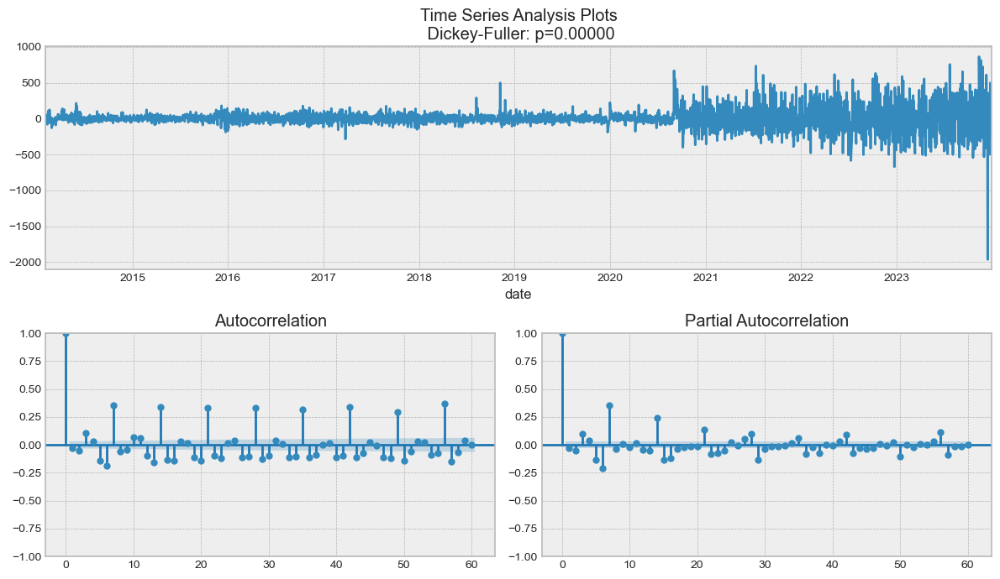

In [ ]:
tsplot(best_model.resid[30+1:], lags=60)

In [ ]:
def plotSARIMA(series, model, n_steps):
    """
    Plots model vs predicted values
    
    series - dataset with timeseries
    model - fitted SARIMA model
    n_steps - number of steps to predict in the future
    s - length of season
    d - integration order in ARIMA model
    """
    # adding model values
    data = series.copy()
    data.columns = ['actual']
    data['arima_model'] = model.fittedvalues
    
    # making a shift on s+d steps, because these values were unobserved by the model due to the differentiating
    data['arima_model'] = data['arima_model'].shift(s + d)
    
    # forecasting on n_steps forward 
    forecast = model.get_forecast(steps=n_steps).predicted_mean
    forecast_index = pd.date_range(start=data.index[-1], periods=n_steps + 1, freq='D')[1:]
    forecast = pd.Series(forecast, index=forecast_index)
    forecast = pd.concat([data['arima_model'], forecast])
    
    # calculate error, again having shifted on s+d steps from the beginning
    error = mean_absolute_percentage_error(data['actual'][s + d:], data['arima_model'][s + d:])

    plt.figure(figsize=(100, 5))
    plt.title(f"Mean Absolute Percentage Error: {error:.2f}%")
    plt.plot(data['actual'], label="actual")
    plt.plot(forecast, color='r', label="model")
    plt.axvspan(data.index[-1], forecast.index[-1], alpha=0.5, color='lightgrey')
    plt.legend()
    plt.grid(True)
    plt.show()


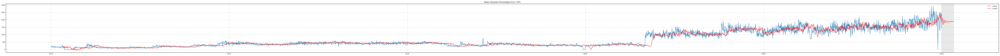

In [ ]:
plotSARIMA(df_daily, best_model, 50)

# Random Forest Prediction

In [76]:
# Creating a copy of the initial datagrame to make various transformations 
data = pd.DataFrame(df_daily.calls.copy())
data.columns = ["y"]

In [46]:
# Adding the lag of the target variable from 6 steps back up to 24
for i in range(6, 31):
    data["lag_{}".format(i)] = data.y.shift(i)

In [47]:
# take a look at the new dataframe 
data.tail(7)

,y,lag_6,lag_7,lag_8,lag_9,lag_10,lag_11,lag_12,lag_13,lag_14,...,lag_21,lag_22,lag_23,lag_24,lag_25,lag_26,lag_27,lag_28,lag_29,lag_30
3645,325.0,394.0,406.0,250.0,2.0,329.0,401.0,376.0,398.0,459.0,...,508.0,361.0,350.0,437.0,458.0,426.0,428.0,540.0,374.0,347.0
3646,485.0,391.0,394.0,406.0,250.0,2.0,329.0,401.0,376.0,398.0,...,431.0,508.0,361.0,350.0,437.0,458.0,426.0,428.0,540.0,374.0
3647,405.0,346.0,391.0,394.0,406.0,250.0,2.0,329.0,401.0,376.0,...,369.0,431.0,508.0,361.0,350.0,437.0,458.0,426.0,428.0,540.0
3648,372.0,339.0,346.0,391.0,394.0,406.0,250.0,2.0,329.0,401.0,...,374.0,369.0,431.0,508.0,361.0,350.0,437.0,458.0,426.0,428.0
3649,363.0,263.0,339.0,346.0,391.0,394.0,406.0,250.0,2.0,329.0,...,340.0,374.0,369.0,431.0,508.0,361.0,350.0,437.0,458.0,426.0
3650,299.0,244.0,263.0,339.0,346.0,391.0,394.0,406.0,250.0,2.0,...,287.0,340.0,374.0,369.0,431.0,508.0,361.0,350.0,437.0,458.0
3651,229.0,325.0,244.0,263.0,339.0,346.0,391.0,394.0,406.0,250.0,...,268.0,287.0,340.0,374.0,369.0,431.0,508.0,361.0,350.0,437.0


In [48]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score

# for time-series cross-validation set 5 folds 
tscv = TimeSeriesSplit(n_splits=5)

In [49]:
def timeseries_train_test_split(X, y, test_size):
    """
        Perform train-test split with respect to time series structure
    """
    
    # get the index after which test set starts
    test_index = int(len(X)*(1-test_size))
    
    X_train = X.iloc[:test_index]
    y_train = y.iloc[:test_index]
    X_test = X.iloc[test_index:]
    y_test = y.iloc[test_index:]
    
    return X_train, X_test, y_train, y_test

In [50]:
y = data.dropna().y
X = data.dropna().drop(['y'], axis=1)

# reserve 30% of data for testing
X_train, X_test, y_train, y_test = timeseries_train_test_split(X, y, test_size=0.3)

In [51]:
# machine learning in two lines
lr = LinearRegression()
lr.fit(X_train, y_train)

LinearRegression()

In [79]:
def plotModelResults(model, X_train=X_train, X_test=X_test, plot_intervals=False, plot_anomalies=False):
    """
        Plots modelled vs fact values, prediction intervals and anomalies
    
    """
    
    prediction = model.predict(X_test)
    
    plt.figure(figsize=(15, 7))
    plt.plot(prediction, "g", label="prediction", linewidth=2.0)
    plt.plot(y_test.values, label="actual", linewidth=2.0)
    
    if plot_intervals:
        cv = cross_val_score(model, X_train, y_train, 
                                    cv=tscv, 
                                    scoring="neg_mean_absolute_error")
        mae = cv.mean() * (-1)
        deviation = cv.std()
        
        scale = 1.96
        lower = prediction - (mae + scale * deviation)
        upper = prediction + (mae + scale * deviation)
        
        plt.plot(lower, "r--", label="upper bond / lower bond", alpha=0.5)
        plt.plot(upper, "r--", alpha=0.5)
        
        if plot_anomalies:
            anomalies = np.array([np.NaN]*len(y_test))
            anomalies[y_test<lower] = y_test[y_test<lower]
            anomalies[y_test>upper] = y_test[y_test>upper]
            plt.plot(anomalies, "o", markersize=10, label = "Anomalies")
    
    error = mean_absolute_percentage_error(prediction, y_test)
    plt.title("Mean absolute percentage error {0:.2f}%".format(error))
    plt.legend(loc="best")
    plt.tight_layout()
    plt.grid(True)
    
def plotCoefficients(model):
    """
        Plots sorted coefficient values of the model
    """
    
    coefs = pd.DataFrame(model.coef_, X_train.columns)
    coefs.columns = ["coef"]
    coefs["abs"] = coefs.coef.apply(np.abs)
    coefs = coefs.sort_values(by="abs", ascending=False).drop(["abs"], axis=1)
    
    plt.figure(figsize=(15, 7))
    coefs.coef.plot(kind='bar')
    plt.grid(True, axis='y')
    plt.hlines(y=0, xmin=0, xmax=len(coefs), linestyles='dashed');

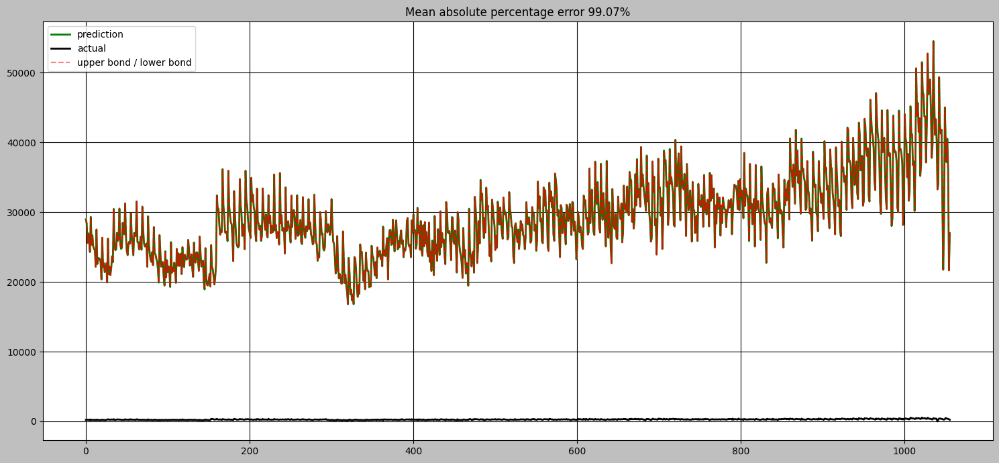

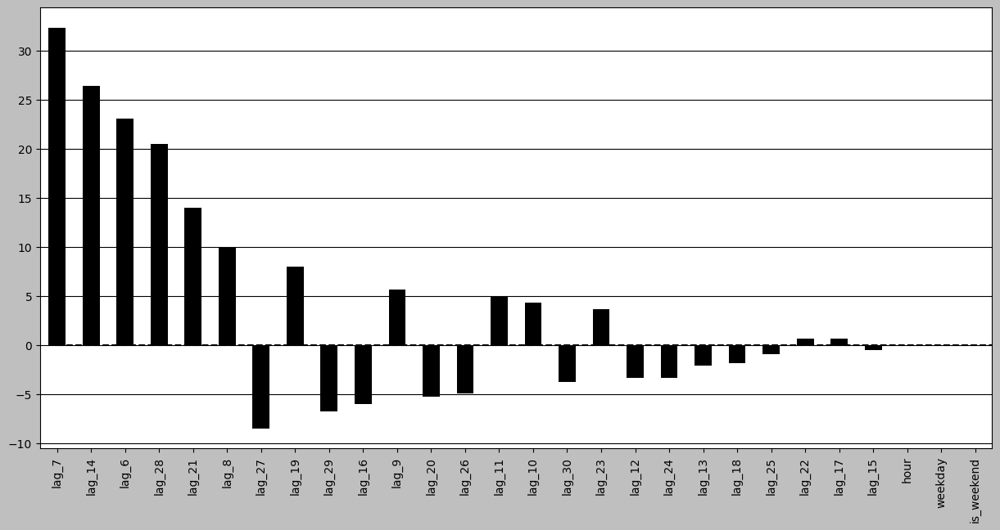

In [80]:
plotModelResults(lr, plot_intervals=True)
plotCoefficients(lr)

In [82]:
data.index = pd.to_datetime(data.index)
data["hour"] = data.index.hour
data["weekday"] = data.index.weekday
data['is_weekend'] = data.weekday.isin([5,6])*1
data.tail()

,y,hour,weekday,is_weekend
1970-01-01 00:00:00.000003647,405.0,0,3,0
1970-01-01 00:00:00.000003648,372.0,0,3,0
1970-01-01 00:00:00.000003649,363.0,0,3,0
1970-01-01 00:00:00.000003650,299.0,0,3,0
1970-01-01 00:00:00.000003651,229.0,0,3,0


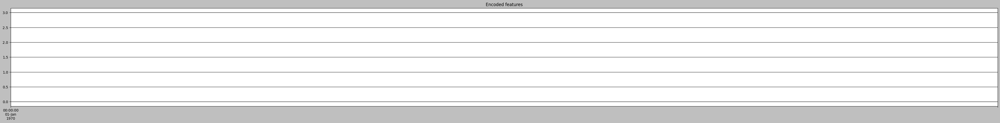

In [83]:
plt.figure(figsize=(50, 5))
plt.title("Encoded features")
data.hour.plot()
data.weekday.plot()
data.is_weekend.plot()
plt.grid(True)

In [84]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

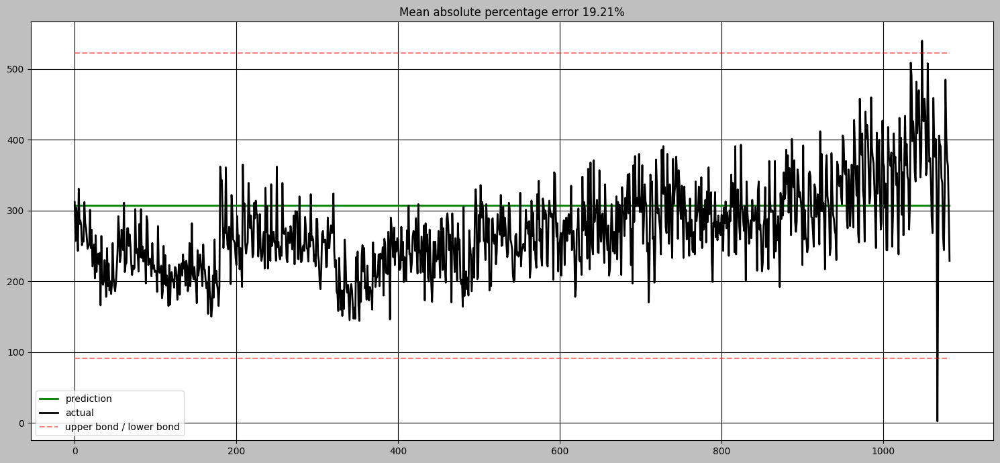

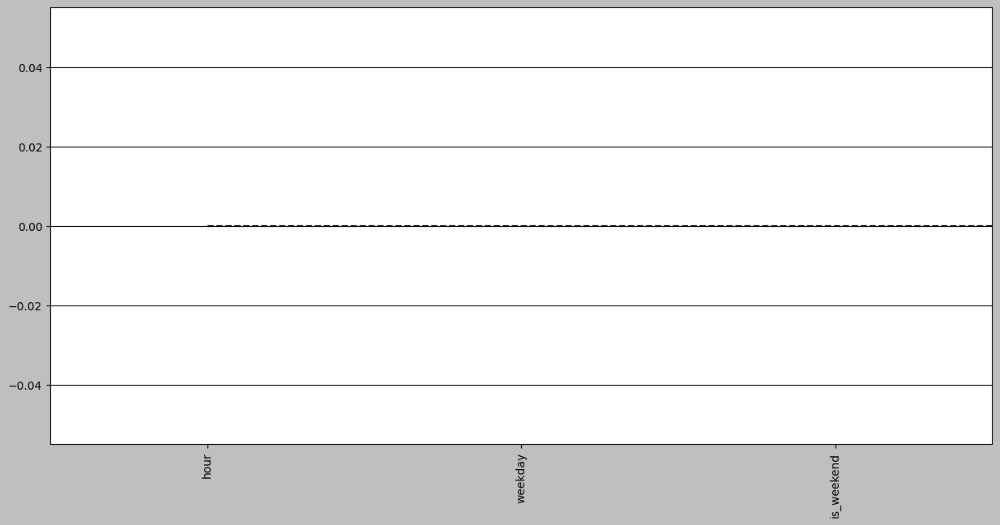

In [85]:
y = data.dropna().y
X = data.dropna().drop(['y'], axis=1)

X_train, X_test, y_train, y_test = timeseries_train_test_split(X, y, test_size=0.3)

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

lr = LinearRegression()
lr.fit(X_train_scaled, y_train)

plotModelResults(lr, X_train=X_train_scaled, X_test=X_test_scaled, plot_intervals=True)
plotCoefficients(lr)

In [86]:
def code_mean(data, cat_feature, real_feature):
    """
    Returns a dictionary where keys are unique categories of the cat_feature,
    and values are means over real_feature
    """
    return dict(data.groupby(cat_feature)[real_feature].mean())

In [87]:
average_weekday = code_mean(data, 'weekday', "y")

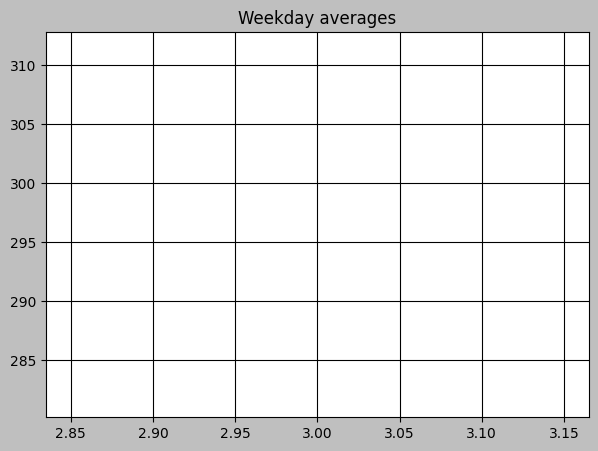

In [88]:
average_weekday = code_mean(data, 'weekday', "y")
plt.figure(figsize=(7, 5))
plt.title("Weekday averages")
pd.DataFrame.from_dict(average_weekday, orient='index')[0].plot()
plt.grid(True)

In [89]:
def prepareData(series, lag_start, lag_end, test_size, target_encoding=False):
    """
        series: pd.DataFrame
            dataframe with timeseries

        lag_start: int
            initial step back in time to slice target variable 
            example - lag_start = 1 means that the model 
                      will see yesterday's values to predict today

        lag_end: int
            final step back in time to slice target variable
            example - lag_end = 4 means that the model 
                      will see up to 4 days back in time to predict today

        test_size: float
            size of the test dataset after train/test split as percentage of dataset

        target_encoding: boolean
            if True - add target averages to the dataset
        
    """
    
    # copy of the initial dataset
    data = pd.DataFrame(series.copy())
    data.columns = ["y"]
    
    # lags of series
    for i in range(lag_start, lag_end):
        data["lag_{}".format(i)] = data.y.shift(i)
    
    # datetime features
    data.index = pd.to_datetime(data.index)
    data["weekday"] = data.index.weekday
    data['is_weekend'] = data.weekday.isin([5,6])*1
    
    if target_encoding:
        # calculate averages on train set only
        test_index = int(len(data.dropna())*(1-test_size))
        data['weekday_average'] = list(map(code_mean(data[:test_index], 'weekday', "y").get, data.weekday))

        # frop encoded variables 
        data.drop(["weekday"], axis=1, inplace=True)
    
    # train-test split
    y = data.dropna().y
    X = data.dropna().drop(['y'], axis=1)
    X_train, X_test, y_train, y_test = timeseries_train_test_split(X, y, test_size=test_size)

    return X_train, X_test, y_train, y_test

AttributeError: `np.NaN` was removed in the NumPy 2.0 release. Use `np.nan` instead.

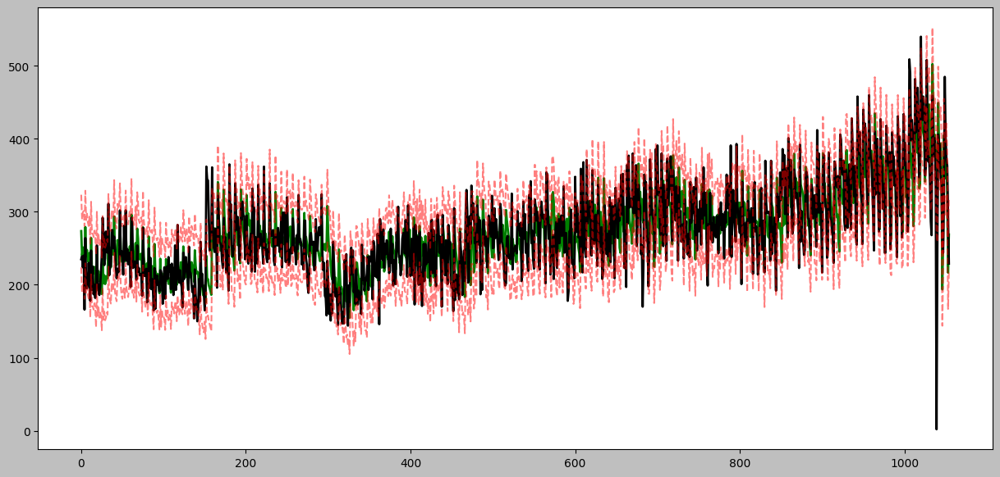

In [90]:
X_train, X_test, y_train, y_test = prepareData(df_daily.calls, lag_start=7, lag_end=32, test_size=0.3, target_encoding=True)

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

lr = LinearRegression()
lr.fit(X_train_scaled, y_train)

plotModelResults(lr, X_train=X_train_scaled, X_test=X_test_scaled, plot_intervals=True, plot_anomalies=True)
plotCoefficients(lr)

In [91]:
X_train, X_test, y_train, y_test =\
prepareData(df_daily.calls, lag_start=7, lag_end=32, test_size=0.3, target_encoding=False)

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

<Axes: >

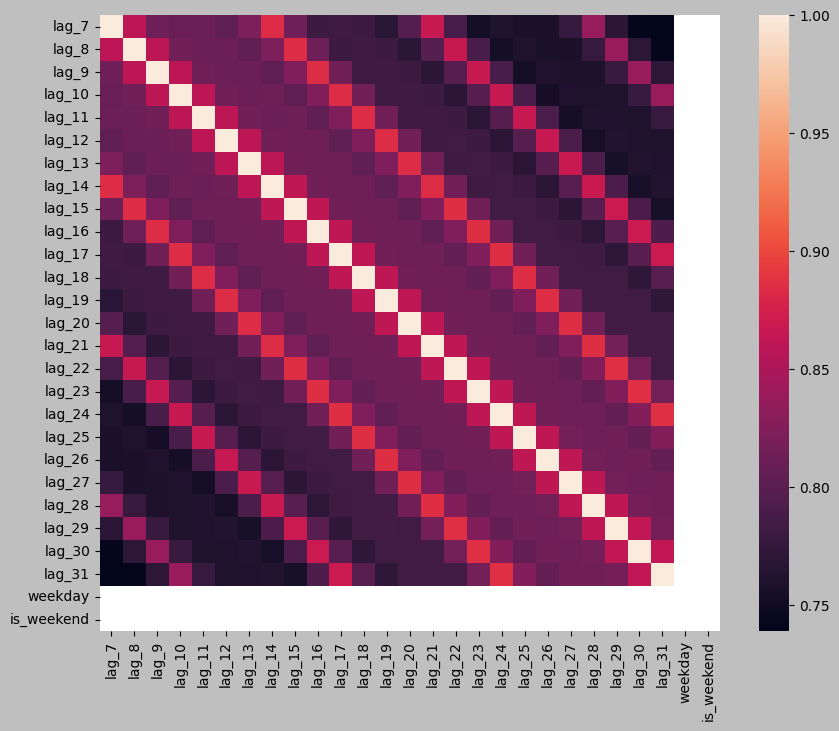

In [93]:
plt.figure(figsize=(10, 8))
sns.heatmap(X_train.corr())

AttributeError: `np.NaN` was removed in the NumPy 2.0 release. Use `np.nan` instead.

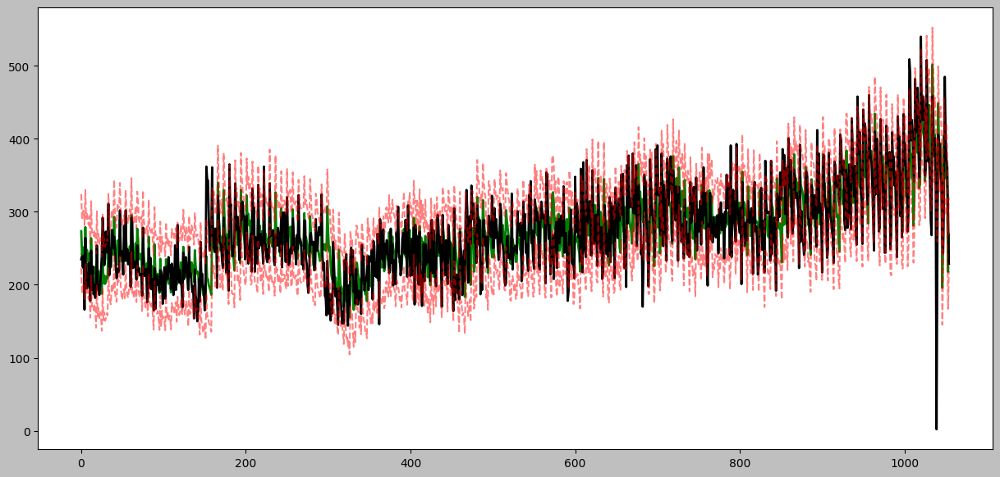

In [94]:
from sklearn.linear_model import LassoCV, RidgeCV

ridge = RidgeCV(cv=tscv)
ridge.fit(X_train_scaled, y_train)

plotModelResults(ridge, 
                 X_train=X_train_scaled, 
                 X_test=X_test_scaled, 
                 plot_intervals=True, plot_anomalies=True)
plotCoefficients(ridge)

AttributeError: `np.NaN` was removed in the NumPy 2.0 release. Use `np.nan` instead.

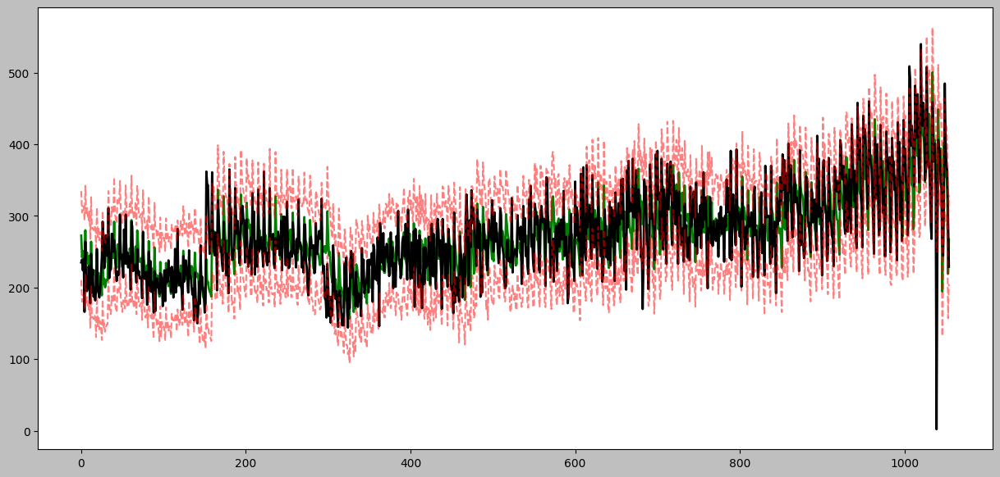

In [95]:
lasso = LassoCV(cv=tscv)
lasso.fit(X_train_scaled, y_train)

plotModelResults(lasso, 
                 X_train=X_train_scaled, 
                 X_test=X_test_scaled, 
                 plot_intervals=True, plot_anomalies=True)
plotCoefficients(lasso)

# XGBoosting Machine

In [96]:
from xgboost import XGBRegressor 

xgb = XGBRegressor()
xgb.fit(X_train_scaled, y_train)

AttributeError: 'super' object has no attribute '__sklearn_tags__'

AttributeError: 'super' object has no attribute '__sklearn_tags__'

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

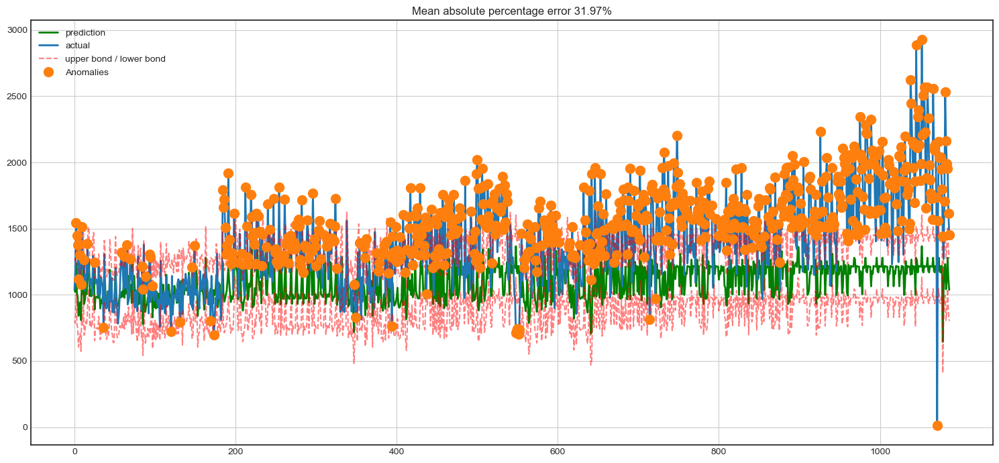

In [ ]:
plotModelResults(xgb, 
                 X_train=X_train_scaled, 
                 X_test=X_test_scaled, 
                 plot_intervals=True, plot_anomalies=True)

# Calls per Hour Using Prophet for Forecasting
https://www.kaggle.com/code/robikscube/time-series-forecasting-with-prophet?scriptVersionId=26595661

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from prophet import Prophet
from sklearn.metrics import mean_squared_error, mean_absolute_error
plt.style.use('fivethirtyeight') # For plots

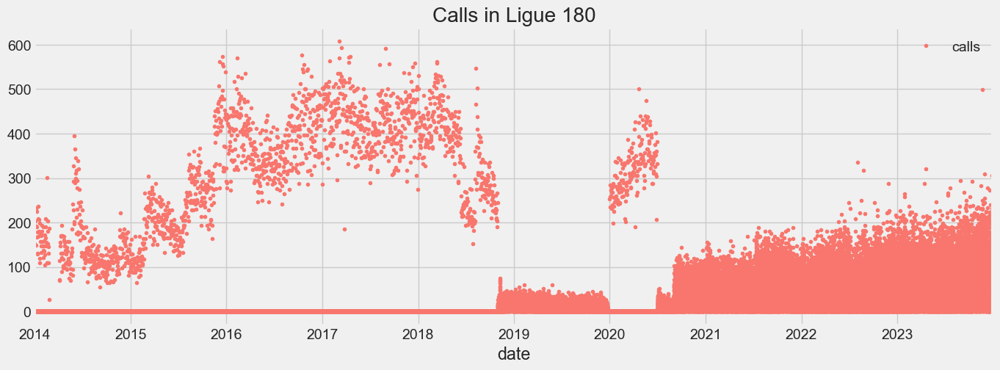

In [ ]:
# Color pallete for plotting
color_pal = ["#F8766D", "#D39200", "#93AA00",
             "#00BA38", "#00C19F", "#00B9E3",
             "#619CFF", "#DB72FB"]
df_hourly.plot(style='.', figsize=(15,5), color=color_pal[0], title='Calls in Ligue 180')
plt.show()

In [ ]:
df_hourly

,calls
date,
2014-01-01 00:00:00,153
2014-01-01 01:00:00,0
2014-01-01 02:00:00,0
2014-01-01 03:00:00,0
2014-01-01 04:00:00,0
...,...
2023-12-31 19:00:00,98
2023-12-31 20:00:00,84
2023-12-31 21:00:00,68


## EDA

In [ ]:
def create_features(df, label=None):
    """
    Creates time series features from datetime index.
    """
    df = df.copy()
    df['date'] = df.index
    df['hour'] = df['date'].dt.hour
    df['dayofweek'] = df['date'].dt.dayofweek
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year
    df['dayofyear'] = df['date'].dt.dayofyear
    df['dayofmonth'] = df['date'].dt.day
#    df['weekofyear'] = df['date'].dt.weekofyear
    
    X = df[['hour','dayofweek','quarter','month','year',
           'dayofyear','dayofmonth']]
    if label:
        y = df[label]
        return X, y
    return X

X, y = create_features(df_hourly, label="calls")

features_and_target = pd.concat([X, y], axis=1)

In [ ]:
features_and_target.head()

,hour,dayofweek,quarter,month,year,dayofyear,dayofmonth,calls
date,,,,,,,,
2014-01-01 00:00:00,0,2,1,1,2014,1,1,153
2014-01-01 01:00:00,1,2,1,1,2014,1,1,0
2014-01-01 02:00:00,2,2,1,1,2014,1,1,0
2014-01-01 03:00:00,3,2,1,1,2014,1,1,0
2014-01-01 04:00:00,4,2,1,1,2014,1,1,0


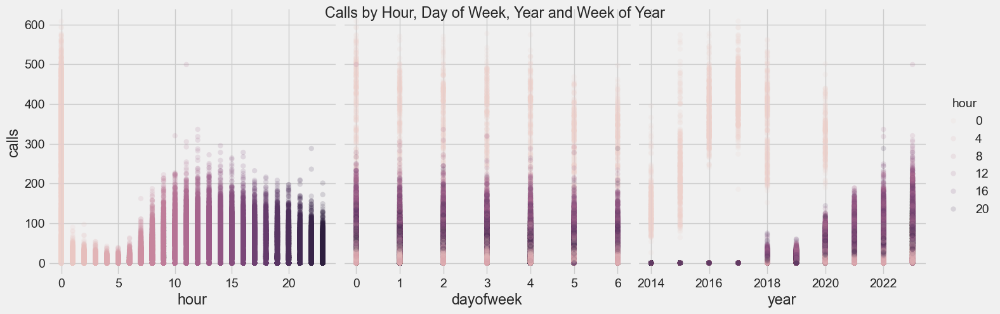

In [ ]:
sns.pairplot(features_and_target.dropna(),
             hue='hour',
             x_vars=['hour','dayofweek',
                     'year'],
             y_vars='calls',
             height=5,
             plot_kws={'alpha':0.15, 'linewidth':0}
            )
plt.suptitle('Calls by Hour, Day of Week, Year and Week of Year')
plt.show()

In [ ]:
split_date = '01-Jul-2023'
df_hourly_train = df_hourly.loc[df_hourly.index <= split_date].copy()
df_hourly_test = df_hourly.loc[df_hourly.index > split_date].copy()

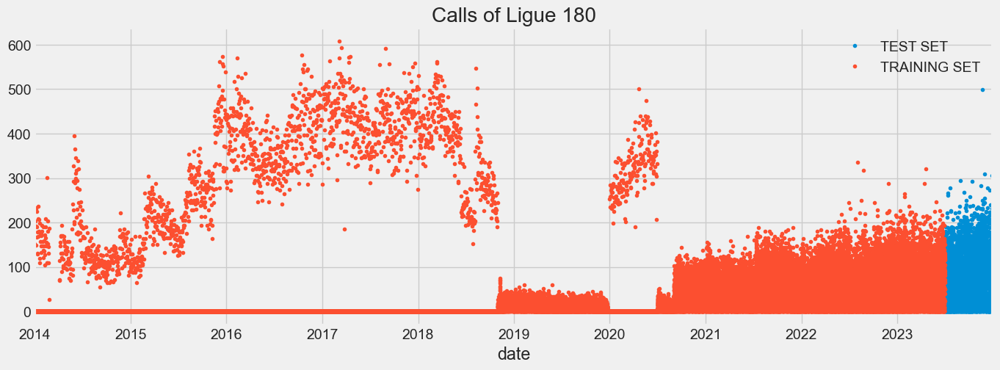

In [ ]:
# Plot train and test so you can see where we have split
df_hourly_test \
    .rename(columns={'calls': 'TEST SET'}) \
    .join(df_hourly_train.rename(columns={'calls': 'TRAINING SET'}),
          how='outer') \
    .plot(figsize=(15,5), title='Calls of Ligue 180', style='.')
plt.show()



In [ ]:
# Format data for prophet model using ds and y
df_hourly_train.reset_index() \
    .rename(columns={'date':'ds',
                     'calls':'y'}).head()

,ds,y
0,2014-01-01 00:00:00,153
1,2014-01-01 01:00:00,0
2,2014-01-01 02:00:00,0
3,2014-01-01 03:00:00,0
4,2014-01-01 04:00:00,0


In [ ]:
# Setup and train model and fit
model = Prophet()
model.fit(df_hourly_train.reset_index() \
              .rename(columns={'date':'ds',
                               'calls':'y'}))

11:01:55 - cmdstanpy - INFO - Chain [1] start processing
11:02:30 - cmdstanpy - INFO - Chain [1] done processing


In [ ]:
# Predict on training set with model
df_hourly_test_fcst = model.predict(df=df_hourly_test.reset_index() \
                                   .rename(columns={'date':'ds'}))

In [ ]:
df_hourly_test_fcst.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2023-07-01 01:00:00,64.995715,28.859927,162.342076,64.995715,64.995715,28.679409,28.679409,28.679409,31.915979,...,-0.970400,-0.970400,-0.970400,-2.266170,-2.266170,-2.266170,0.0,0.0,0.0,93.675124
1,2023-07-01 02:00:00,64.996547,-5.865292,128.192138,64.996547,64.996547,-4.735909,-4.735909,-4.735909,-1.410058,...,-1.053069,-1.053069,-1.053069,-2.272782,-2.272782,-2.272782,0.0,0.0,0.0,60.260638
2,2023-07-01 03:00:00,64.997379,-30.241345,97.640931,64.997379,64.997379,-33.161889,-33.161889,-33.161889,-29.737337,...,-1.145159,-1.145159,-1.145159,-2.279393,-2.279393,-2.279393,0.0,0.0,0.0,31.835489
3,2023-07-01 04:00:00,64.998210,-36.784736,85.180417,64.998210,64.998210,-41.528021,-41.528021,-41.528021,-37.995890,...,-1.246127,-1.246127,-1.246127,-2.286003,-2.286003,-2.286003,0.0,0.0,0.0,23.470189
4,2023-07-01 05:00:00,64.999042,-33.208819,97.048316,64.999042,64.999042,-31.645279,-31.645279,-31.645279,-27.997391,...,-1.355276,-1.355276,-1.355276,-2.292612,-2.292612,-2.292612,0.0,0.0,0.0,33.353763


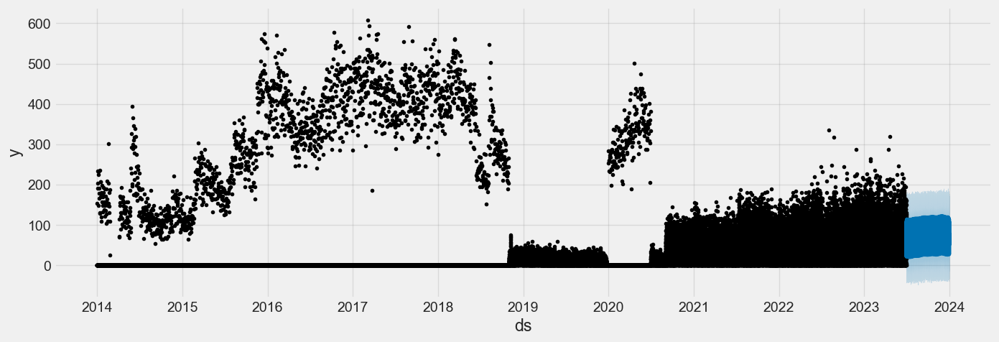

In [ ]:
# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
fig = model.plot(df_hourly_test_fcst,
                 ax=ax)
plt.show()

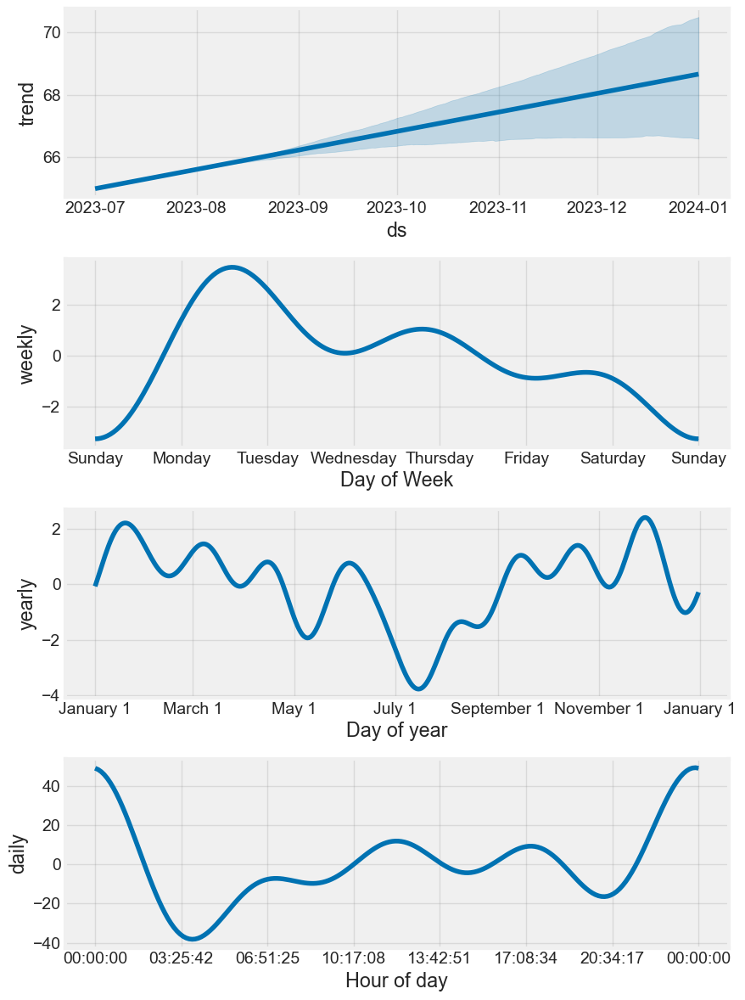

In [ ]:
# Plot the components of the model
fig = model.plot_components(df_hourly_test_fcst)

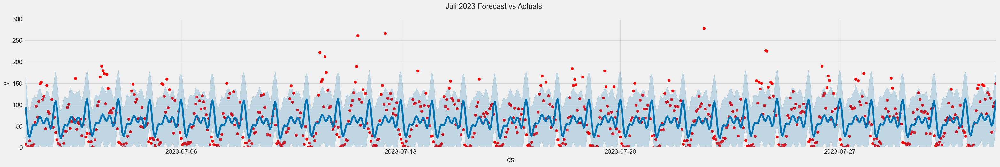

In [ ]:
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(35)
ax.scatter(df_hourly_test.index, df_hourly_test['calls'], color='r')
fig = model.plot(df_hourly_test_fcst, ax=ax)
ax.set_xbound(lower=pd.Timestamp('07-01-2023'),
              upper=pd.Timestamp('08-01-2023'))
ax.set_ylim(0, 300)
plot = plt.suptitle('Juli 2023 Forecast vs Actuals')

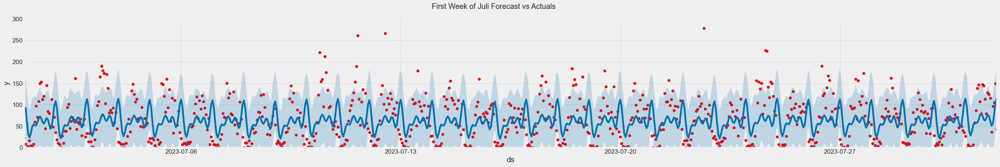

In [ ]:
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(35)
ax.scatter(df_hourly_test.index, df_hourly_test['calls'], color='r')
fig = model.plot(df_hourly_test_fcst, ax=ax)
ax.set_xbound(lower=pd.Timestamp('07-01-2023'),
              upper=pd.Timestamp('08-01-2023'))
ax.set_ylim(0, 300)
plot = plt.suptitle('First Week of Juli Forecast vs Actuals')

## Error Metrics

In [ ]:
mean_squared_error(y_true=df_hourly_test['calls'],
                   y_pred=df_hourly_test_fcst['yhat'])

3244.6152271171745

In [ ]:
mean_absolute_error(y_true=df_hourly_test['calls'],
                   y_pred=df_hourly_test_fcst['yhat'])

45.8731909006002

In [ ]:
df_hourly_test['calls']

date
2023-07-01 01:00:00     8
2023-07-01 02:00:00     0
2023-07-01 03:00:00     3
2023-07-01 04:00:00    16
2023-07-01 05:00:00     4
                       ..
2023-12-31 19:00:00    98
2023-12-31 20:00:00    84
2023-12-31 21:00:00    68
2023-12-31 22:00:00    34
2023-12-31 23:00:00    47
Name: calls, Length: 4415, dtype: int64

In [ ]:
df_hourly_test_fcst['yhat']

0        93.675124
1        60.260638
2        31.835489
3        23.470189
4        33.353763
           ...    
4410     62.843316
4411     52.785892
4412     58.545595
4413     82.196797
4414    109.137841
Name: yhat, Length: 4415, dtype: float64

In [ ]:
def mean_absolute_percentage_error(y_true, y_pred): 
    """Calculates MAPE given y_true and y_pred"""
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    # Filtere die Nullwerte aus
    non_zero_indices = y_true != 0
    y_true = y_true[non_zero_indices]
    y_pred = y_pred[non_zero_indices]
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

mean_absolute_percentage_error(y_true=df_hourly_test['calls'],
                   y_pred=df_hourly_test_fcst['yhat'])


220.64453893446503

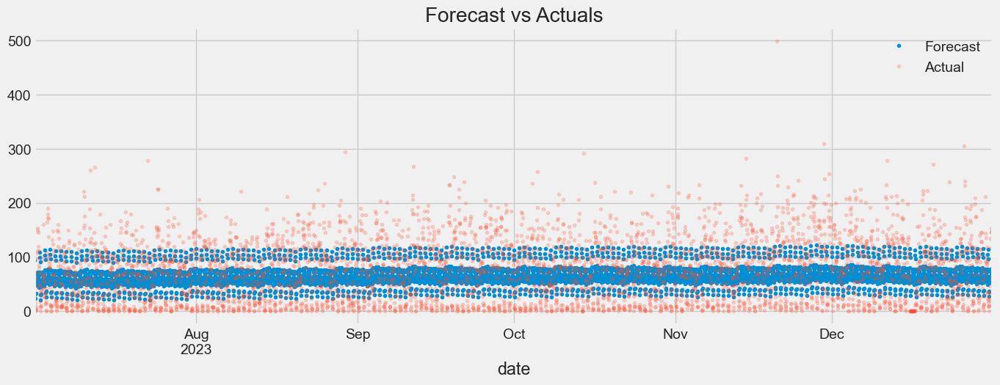

In [ ]:
ax = df_hourly_test_fcst.set_index('ds')['yhat'].plot(figsize=(15, 5),
                                                 lw=0,
                                                 style='.')
df_hourly_test['calls'].plot(ax=ax,
                          style='.',
                          lw=0,
                          alpha=0.2)
plt.legend(['Forecast','Actual'])
plt.title('Forecast vs Actuals')
plt.show()

## Data Cleaning

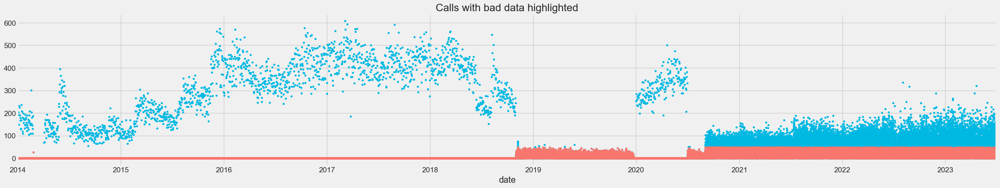

In [ ]:
ax = df_hourly_train.plot(style='.',
                     figsize=(15,5),
                     color=color_pal[5],
                     title='Calls with bad data highlighted',
                     xlim=('01-01-2015','01-01-2016')
                    )
df_hourly_train.query('calls < 50').plot(style='.',
                                             figsize=(30,5),
                                             color=color_pal[0],
                                             ax=ax)
ax.legend().set_visible(False)
plt.show()

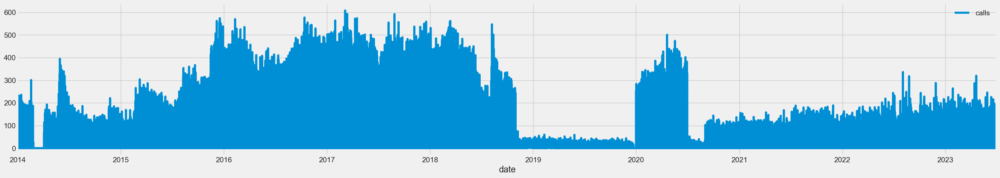

In [ ]:
df_hourly_train.plot(figsize=(30, 5))
plt.show()

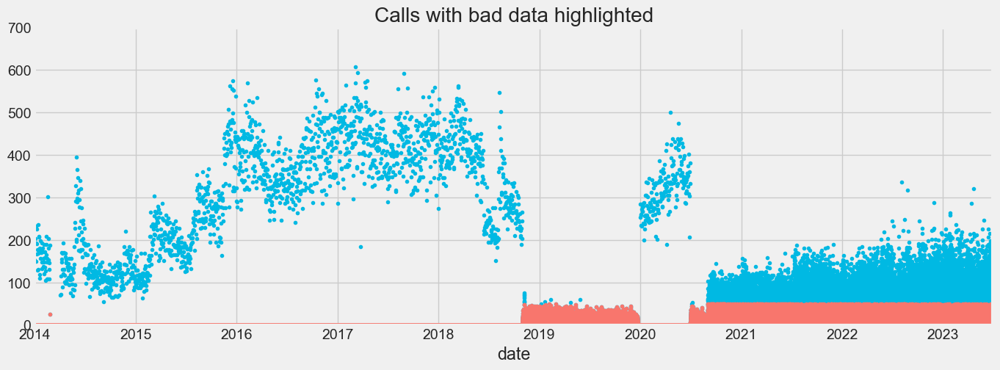

In [ ]:
ax = df_hourly_train.plot(style='.',
                     figsize=(15,5),
                     color=color_pal[5],
                     title='Calls with bad data highlighted',
                     xlim=(pd.Timestamp('10-29-2015'), pd.Timestamp('11-01-2015')),
                     ylim=(0, 700)
                    )
df_hourly_train.query('calls < 50').plot(style='.',
                                             figsize=(15,5),
                                             color=color_pal[0],
                                             ax=ax)
ax.legend().set_visible(False)
plt.show()

In [ ]:
# Clean Data
df_hourly_train['calls_clean'] = df_hourly_train['calls']
df_hourly_train.loc[df_hourly_train['calls'] < 50, 'calls_clean'] = np.nan

# Überprüfe die Spaltennamen
print(df_hourly_train.columns)

# Train model on clean data
model = Prophet()
df_train_clean = df_hourly_train.reset_index().rename(columns={'date': 'ds', 'calls_clean': 'y'})
print(df_train_clean.columns)  # Überprüfe die Spaltennamen nach dem Umbenennen

model.fit(df_train_clean)

# Predict on training set with clean model
df_test_clean = df_hourly_test.reset_index().rename(columns={'date': 'ds'})
df_hourly_test_fcst_clean = model.predict(df_test_clean)

print(df_hourly_test_fcst_clean.head())  # Überprüfe die ersten paar Zeilen der Vorhersagen

Index(['calls', 'calls_clean'], dtype='object')
Index(['ds', 'calls', 'y'], dtype='object')


14:02:58 - cmdstanpy - INFO - Chain [1] start processing
14:03:23 - cmdstanpy - INFO - Chain [1] done processing


                   ds      trend  yhat_lower  yhat_upper  trend_lower  \
0 2023-07-01 01:00:00  83.694199   49.540326  138.437230    83.694199   
1 2023-07-01 02:00:00  83.692701   54.252657  145.838415    83.692701   
2 2023-07-01 03:00:00  83.691204   36.080660  130.384340    83.691204   
3 2023-07-01 04:00:00  83.689707   12.025405  106.311166    83.689707   
4 2023-07-01 05:00:00  83.688209   -7.129631   84.715292    83.688209   

   trend_upper  additive_terms  additive_terms_lower  additive_terms_upper  \
0    83.694199       12.309522             12.309522             12.309522   
1    83.692701       16.014477             16.014477             16.014477   
2    83.691204        2.635491              2.635491              2.635491   
3    83.689707      -22.249835            -22.249835            -22.249835   
4    83.688209      -45.303586            -45.303586            -45.303586   

       daily  ...    weekly  weekly_lower  weekly_upper    yearly  \
0  25.715901  ... -6.36

In [ ]:
mse_clean = mean_squared_error(y_true=df_hourly_test['calls'],
                               y_pred=df_hourly_test_fcst_clean['yhat']
                              )
mae_clean = mean_absolute_error(y_true=df_hourly_test['calls'],
                                y_pred=df_hourly_test_fcst_clean['yhat']
                               )
mape_clean = mean_absolute_percentage_error(y_true=df_hourly_test['calls'],
                                            y_pred=df_hourly_test_fcst_clean['yhat'])
print(f'Cleaned data model has MSE {mse_clean:0.4f} - MAE {mae_clean:0.4f} - MAPE {mape_clean:0.4f}')

Cleaned data model has MSE 3037.0165 - MAE 44.0231 - MAPE 281.2930


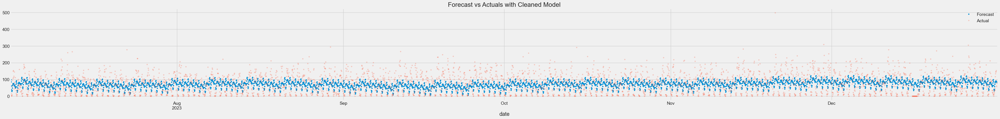

In [ ]:
ax = df_hourly_test_fcst_clean.set_index('ds')['yhat'] \
    .plot(figsize=(50, 5), lw=0, style='.')
df_hourly_test['calls'].plot(ax=ax, style='.', lw=0, alpha=0.2)
plt.legend(['Forecast','Actual'])
plt.title('Forecast vs Actuals with Cleaned Model')
plt.show()

# Hourly Time Series Forecasting using XGBoost
https://www.kaggle.com/code/robikscube/tutorial-time-series-forecasting-with-xgboost

In [ ]:
import xgboost as xgb
from xgboost import plot_importance, plot_tree
from sklearn.metrics import mean_squared_error, mean_absolute_error
plt.style.use('fivethirtyeight')

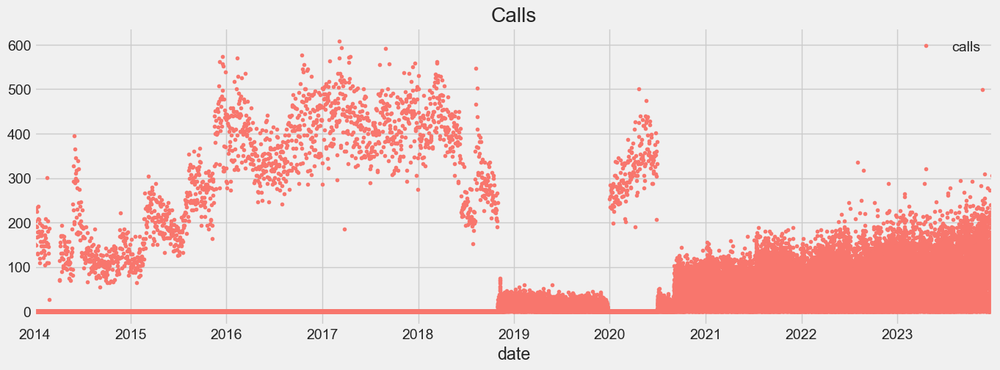

In [ ]:
color_pal = ["#F8766D", "#D39200", "#93AA00", "#00BA38", "#00C19F", "#00B9E3", "#619CFF", "#DB72FB"]
_ = df_hourly.plot(style='.', figsize=(15,5), color=color_pal[0], title='Calls')

In [ ]:
split_date = '01-Jan-2023'
df_hourly_train = df_hourly.loc[df_hourly.index <= split_date].copy()
df_hourly_test = df_hourly.loc[df_hourly.index > split_date].copy()

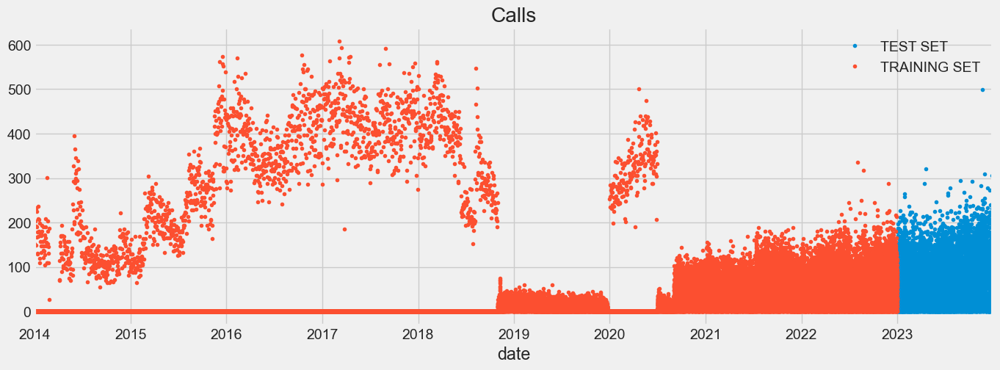

In [ ]:
_ = df_hourly_test \
    .rename(columns={'calls': 'TEST SET'}) \
    .join(df_hourly_train.rename(columns={'calls': 'TRAINING SET'}), how='outer') \
    .plot(figsize=(15,5), title='Calls', style='.')

In [ ]:
def create_features(df, label=None):
    """
    Creates time series features from datetime index
    """
    df['date'] = df.index
    df['hour'] = df['date'].dt.hour
    df['dayofweek'] = df['date'].dt.dayofweek
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year
    df['dayofyear'] = df['date'].dt.dayofyear
    df['dayofmonth'] = df['date'].dt.day
    
    X = df[['hour','dayofweek','quarter','month','year',
           'dayofyear','dayofmonth']]
    if label:
        y = df[label]
        return X, y
    return X

In [ ]:
X_train, y_train = create_features(df_hourly_train, label='calls')
X_test, y_test = create_features(df_hourly_test, label='calls')

In [ ]:
reg = xgb.XGBRegressor(n_estimators=1000)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
       verbose=False) # Change verbose to True if you want to see it train

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=1000, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

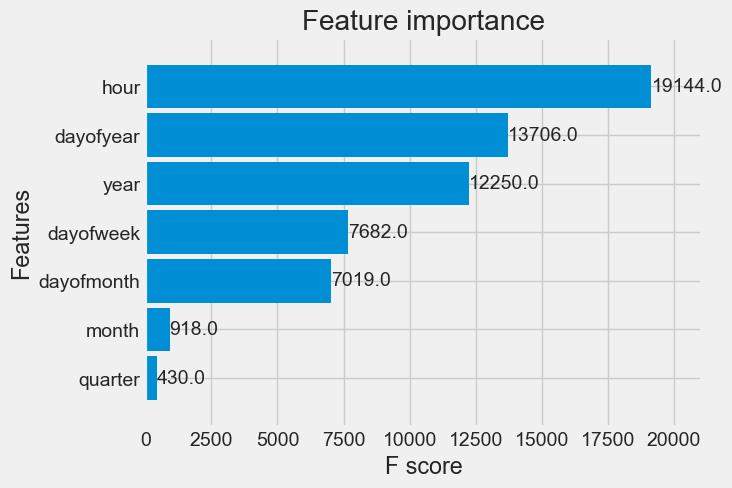

In [ ]:
_ = plot_importance(reg, height=0.9)

## Forecast on Test Set

In [ ]:
df_hourly_test['calls_prediction'] = reg.predict(X_test)
df_hourly_all = pd.concat([df_hourly_test, df_hourly_train], sort=False)

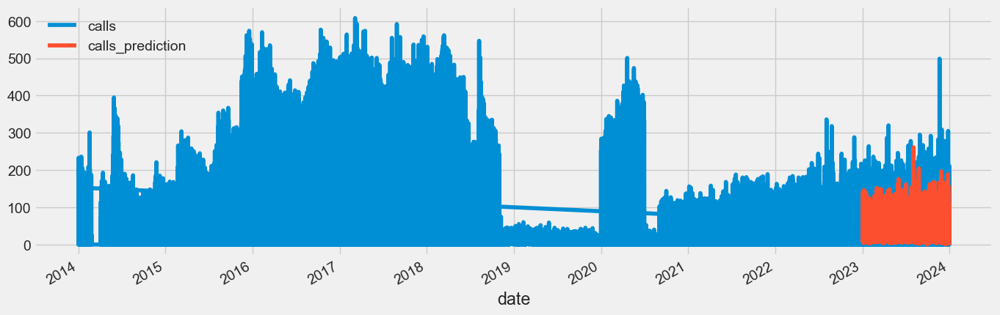

In [ ]:
_ = df_hourly_all[['calls','calls_prediction']].plot(figsize=(15, 5))

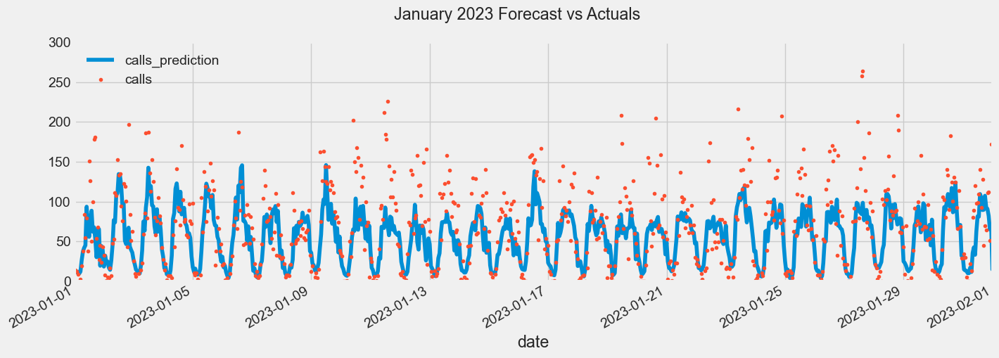

In [ ]:
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
_ = df_hourly_all[['calls_prediction','calls']].plot(ax=ax,
                                              style=['-','.'])
ax.set_xbound(lower=pd.Timestamp('01-01-2023'), upper=pd.Timestamp('02-01-2023'))
ax.set_ylim(0, 300)
plot = plt.suptitle('January 2023 Forecast vs Actuals')

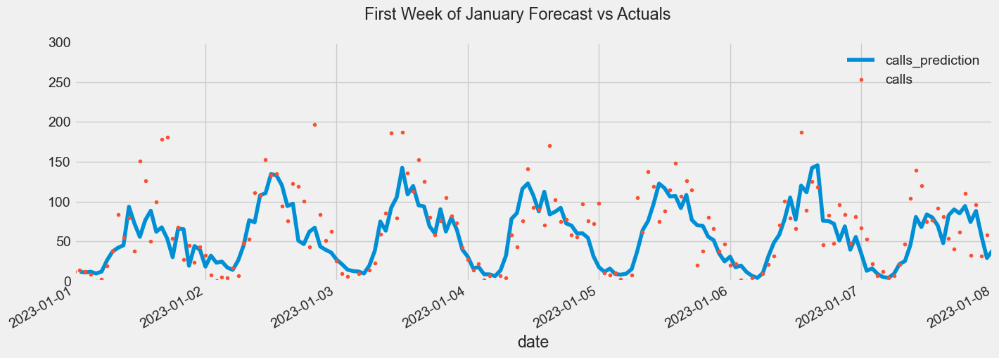

In [ ]:
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
_ = df_hourly_all[['calls_prediction','calls']].plot(ax=ax,
                                              style=['-','.'])
ax.set_xbound(lower=pd.Timestamp('01-01-2023'), upper=pd.Timestamp('01-08-2023'))
ax.set_ylim(0, 300)
plot = plt.suptitle('First Week of January Forecast vs Actuals')

## Error Metrics On Test Set

In [ ]:
mean_squared_error(y_true=df_hourly_test['calls'],
                   y_pred=df_hourly_test['calls_prediction'])

1325.8051967984288

In [ ]:
mean_absolute_error(y_true=df_hourly_test['calls'],
                   y_pred=df_hourly_test['calls_prediction'])

25.530608554170275

In [ ]:
def mean_absolute_percentage_error(y_true, y_pred): 
    """Calculates MAPE given y_true and y_pred"""
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    # Filter out zero values in y_true
    non_zero_indices = y_true != 0
    y_true = y_true[non_zero_indices]
    y_pred = y_pred[non_zero_indices]
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [ ]:
mean_absolute_percentage_error(y_true=df_hourly_test['calls'],
                   y_pred=df_hourly_test['calls_prediction'])

71.7892127796767

In [ ]:
df_hourly_test['error'] = df_hourly_test['calls'] - df_hourly_test['calls_prediction']
df_hourly_test['abs_error'] = df_hourly_test['error'].apply(np.abs)
error_by_day = df_hourly_test.groupby(['year','month','dayofmonth']) \
    .mean()[['calls','calls_prediction','error','abs_error']]

In [ ]:
# Over forecasted days
error_by_day.sort_values('error', ascending=True).head(10)

calls  calls_prediction      error  abs_error
year month dayofmonth                                                   
2023 12    16           0.458333         70.576538 -70.118203  70.118203
     3     13          43.833333         74.778336 -30.945002  48.177088
     5     30          51.375000         79.329239 -27.954238  30.798766
     6     1           57.208333         82.491776 -25.283440  34.546957
           4           43.000000         68.023621 -25.023619  28.776627
     4     11          48.125000         72.301292 -24.176288  28.107414
     5     24          64.416667         85.457100 -21.040436  32.120777
           31          59.125000         78.950974 -19.825975  25.800776
     6     24          57.000000         76.611649 -19.611646  25.927389
     5     28          51.333333         70.461006 -19.127670  27.508541

In [ ]:
# Worst absolute predicted days
error_by_day.sort_values('abs_error', ascending=False).head(10)

calls  calls_prediction      error  abs_error
year month dayofmonth                                                    
2023 12    16            0.458333         70.576538 -70.118203  70.118203
     3     13           43.833333         74.778336 -30.945002  48.177088
     11    20          120.375000         76.998894  43.376103  47.534232
           23           99.750000         57.850300  41.899697  44.648594
     7     11           78.875000         36.524109  42.350891  44.582326
     11    14          101.958333         58.976044  42.982289  44.532809
           13          109.333333         72.713203  36.620126  44.406714
           29          104.458333         69.699623  34.758710  44.244396
     1     11           86.541667         49.803562  36.738103  42.736196
     9     20           92.500000         56.569447  35.930553  42.115619

In [ ]:
# Best predicted days
error_by_day.sort_values('abs_error', ascending=True).head(10)

calls  calls_prediction      error  abs_error
year month dayofmonth                                                   
2023 5     18          51.333333         60.176037  -8.842700  13.687804
     7     23          49.708333         54.192383  -4.484052  13.979671
     1     8           48.166667         47.564182   0.602481  14.015478
     5     10          58.375000         54.754856   3.620143  14.158199
           15          60.000000         71.100578 -11.100581  14.203710
     2     16          54.750000         58.605709  -3.855707  14.421824
     5     12          56.708333         56.796894  -0.088560  14.487803
     2     10          56.583333         55.156586   1.426746  14.615409
           18          57.833333         54.084751   3.748581  14.854404
     6     26          75.541667         81.040443  -5.498780  14.856203

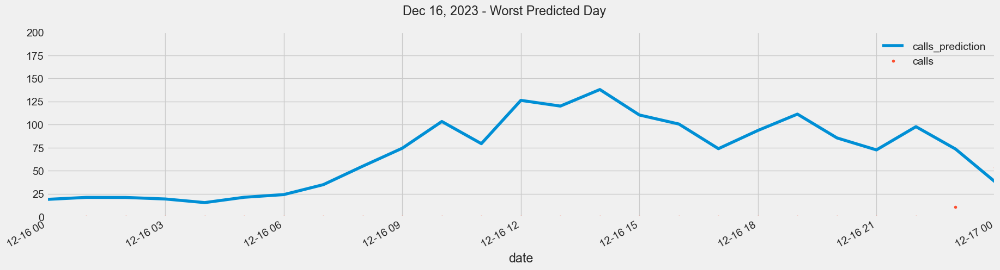

In [ ]:
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(20)
_ = df_hourly_all[['calls_prediction','calls']].plot(ax=ax,
                                              style=['-','.'])
ax.set_ylim(0, 200)
ax.set_xbound(lower=pd.Timestamp('12-16-2023'), upper=pd.Timestamp('12-17-2023'))
plot = plt.suptitle('Dec 16, 2023 - Worst Predicted Day')

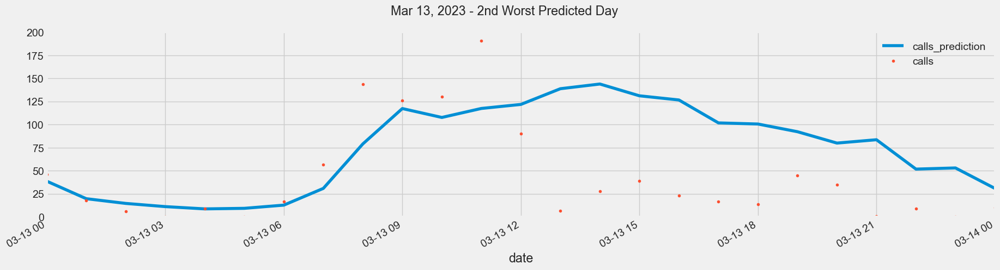

In [ ]:
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(20)
_ = df_hourly_all[['calls_prediction','calls']].plot(ax=ax,
                                              style=['-','.'])
ax.set_ylim(0, 200)
ax.set_xbound(lower=pd.Timestamp('03-13-2023'), upper=pd.Timestamp('03-14-2023'))
plot = plt.suptitle('Mar 13, 2023 - 2nd Worst Predicted Day')

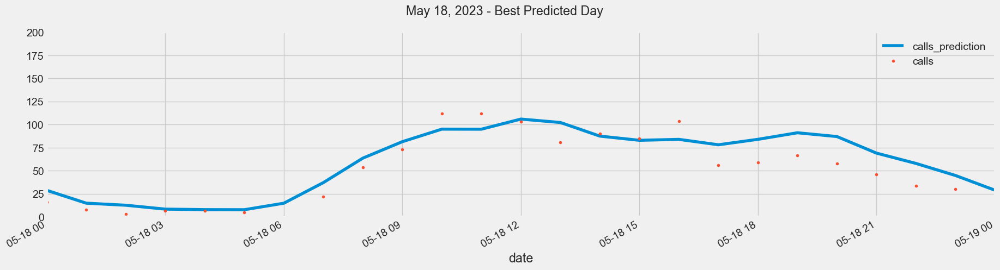

In [ ]:
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(20)
_ = df_hourly_all[['calls_prediction','calls']].plot(ax=ax,
                                              style=['-','.'])
ax.set_ylim(0, 200)
ax.set_xbound(lower=pd.Timestamp('05-18-2023'), upper=pd.Timestamp('05-19-2023'))
plot = plt.suptitle('May 18, 2023 - Best Predicted Day')

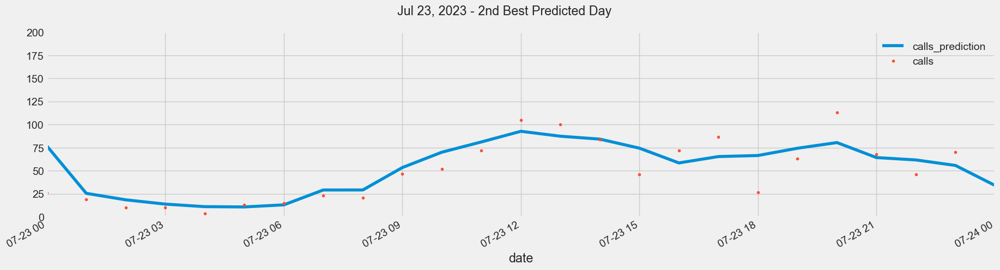

In [ ]:
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(20)
_ = df_hourly_all[['calls_prediction','calls']].plot(ax=ax,
                                              style=['-','.'])
ax.set_ylim(0, 200)
ax.set_xbound(lower=pd.Timestamp('07-23-2023'), upper=pd.Timestamp('07-24-2023'))
plot = plt.suptitle('Jul 23, 2023 - 2nd Best Predicted Day')